<a href="https://colab.research.google.com/github/mdazab/DATA5322-Homework-4/blob/main/hofidar_analysis_MD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Code Practical Homework 4: Unsupervised Learning

## Load Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

## Load Data

In [2]:
url = "https://raw.githubusercontent.com/mdazab/DATA5322-Homework-4/01ab29286c5ef1532b2ad99474b2236521119465/Hofidar_Cost_Center_Report.csv"
df = pd.read_csv(url)

df.head()

,Year,License Number,Hospital Name,Acct #,Cost Center,ID FTE s,Units of Measure,Salaries Wages,Employee Benefits,Professional Fees,...,Utilities,Other Noncategorized Expenses,Cost Recoveries,Operating Expenses,Allocated Expenses,Plant Sq Feet,Dietary Meals,Housekeeping Hours,Laundry Dry Lbs,Nursing FTE s
0,2018,1,Swedish Health Services DBA Swedish Medical Cent,6010,ICU or Combined ICU-CCU,293.73,29562,30226470,4609431,1896584,...,0,0,1390,41624622,43082868,85986,192205,10901,1292872,192.05
1,2019,1,Swedish Health Services DBA Swedish Medical Cent,6010,ICU or Combined ICU-CCU,315.34,58040,34310765,5176437,2695345,...,0,0,16480,47653505,47164648,85986,225238,11080,1537737,207.90
2,2020,1,Swedish Health Services DBA Swedish Medical Cent,6010,ICU or Combined ICU-CCU,312.25,61858,36778517,5080150,3275253,...,0,0,6556,51674146,47904192,85986,237665,10831,1638252,205.13
3,2021,1,Swedish Health Services DBA Swedish Medical Cent,6010,ICU or Combined ICU-CCU,283.63,56193,36710859,4990817,3525876,...,0,0,33657,51660408,48273323,85986,0,386564,15922,181.60
4,2022,1,Swedish Health Services DBA Swedish Medical Cent,6010,ICU or Combined ICU-CCU,309.64,13801,23232296,1105754,198446,...,0,77151,0,28887656,0,50191,0,7496,0,189.40


## Remove Categorial Variables

In [3]:
cat_names = df[['Year', 'License Number', 'Hospital Name', 'Acct #', 'Cost Center']]
df_clean = df.drop(columns=['Year', 'License Number', 'Hospital Name', 'Acct #', 'Cost Center'])


## Data QC

### Checking columns with Zeros, NaN or empty strings

Table for columns with Zeros, NaN, or empty strings

In [4]:
empty_string_count = (df.astype(str).apply(lambda x: x.str.strip()) == '').sum()
df_vis = df_clean.apply(pd.to_numeric, errors='coerce')
n_rows = len(df_vis)

summary = pd.DataFrame({
    'Zero Count': (df_vis == 0).sum(),
    'NaN Count': df_vis.isna().sum(),
    'Empty String Count': empty_string_count
})
summary['Zero %'] = (summary['Zero Count'] / n_rows) * 100
summary['NaN %'] = (summary['NaN Count'] / n_rows) * 100
summary['Empty String %'] = (summary['Empty String Count'] / n_rows) * 100
summary = summary[(summary['Zero Count'] > 0) |
                  (summary['NaN Count'] > 0) |
                  (summary['Empty String Count'] > 0)]

summary = summary.sort_values(by='Zero Count', ascending=False)

summary.style.format({
    'Zero %': '{:.2f}%',
    'NaN %': '{:.2f}%',
    'Empty String %': '{:.2f}%',
    'Zero Count': '{:,}',
    'NaN Count': '{:,}',
    'Empty String Count': '{:,}'
})

,Zero Count,NaN Count,Empty String Count,Zero %,NaN %,Empty String %
Purchased Laboratory Services,"43,107.0",0.0,0,99.75%,0.00%,0.00%
Legal Audit and Tax services,"43,023.0",0.0,0,99.55%,0.00%,0.00%
Blood Supplies,"42,981.0",0.0,0,99.45%,0.00%,0.00%
Staff Recruitment,"42,740.0",0.0,0,98.90%,0.00%,0.00%
Laundry Services,"42,703.0",0.0,0,98.81%,0.00%,0.00%
Insurance and Professional Liability,"42,647.0",0.0,0,98.68%,0.00%,0.00%
Taxes,"42,617.0",0.0,0,98.61%,0.00%,0.00%
Utilities,"42,490.0",0.0,0,98.32%,0.00%,0.00%
Shared Services or System Office Allocation,"42,488.0",0.0,0,98.31%,0.00%,0.00%
Information Technology Including Licenses and Maintenance,"42,445.0",0.0,0,98.21%,0.00%,0.00%


Columns only had Zero values, we did not find NaN nor empty string values. Next, plotted the distribution of Zeros across columns.

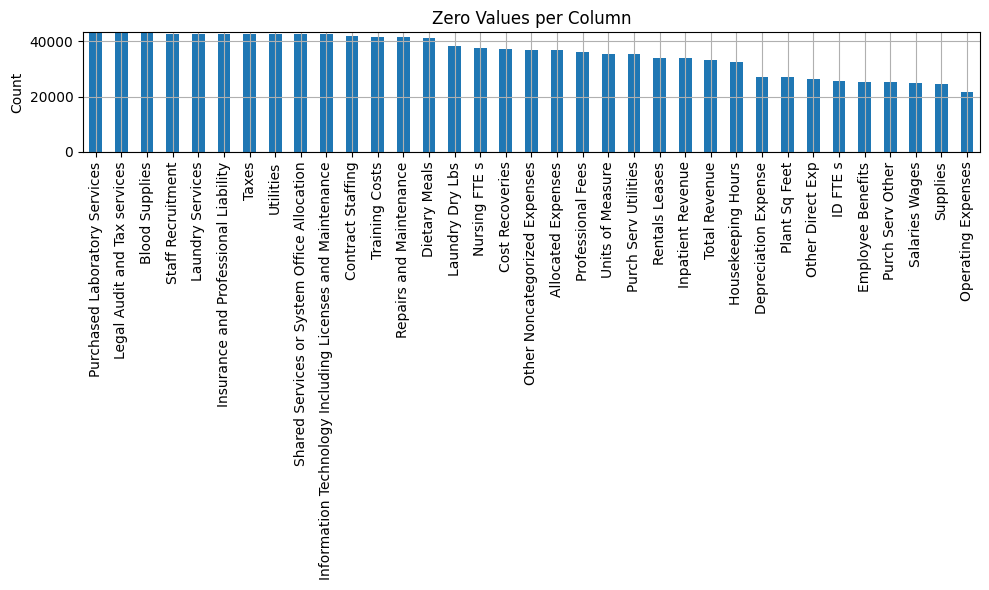

In [5]:
zero_counts = (df_vis == 0).sum().sort_values(ascending=False)
zero_counts = zero_counts[zero_counts > 0]

plt.figure(figsize=(10, 6))
zero_counts.plot(kind='bar')
plt.ylim(0, len(df_vis))
plt.title("Zero Values per Column")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.grid(True)
plt.tight_layout()
plt.show()

### Checking for Min and Max Values

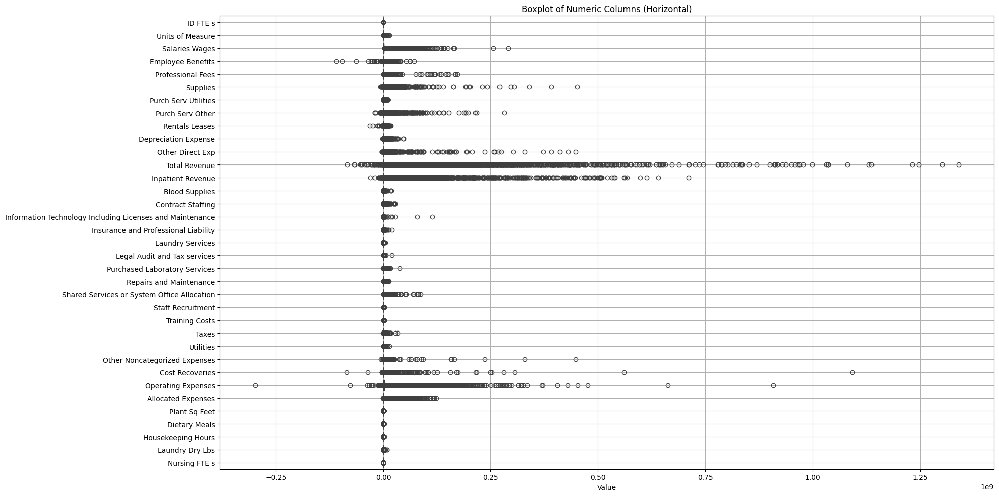

In [6]:
plt.figure(figsize=(20, 10))
sns.boxplot(data=df_vis, orient='h')
plt.title("Boxplot of Numeric Columns (Horizontal)")
plt.xlabel("Value")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Checking for Negative values

In [7]:
neg_counts_by_column = (
    df[df.select_dtypes(include='number').lt(0).any(axis=1)]
    .melt(value_vars=df.select_dtypes(include='number').columns)
    .query('value < 0')
    .groupby('variable')
    .size()
    .reset_index(name='Negative Count')
    .sort_values(by='Negative Count', ascending=False)
)

print(neg_counts_by_column.to_string(index=False))

                                                 variable  Negative Count
                                                 Supplies             471
                                         Other Direct Exp             394
                                       Operating Expenses             335
                                         Purch Serv Other             298
                                           Rentals Leases             231
                            Other Noncategorized Expenses             211
                                          Cost Recoveries             199
                                        Professional Fees             162
                                        Inpatient Revenue             118
                                            Total Revenue              90
                                        Employee Benefits              89
                                        Contract Staffing              78
                                     P

####  Columns with Negative Values

- Financial: Salaries Wages, Supplies, Depreciation Expense, Total Revenue
- Staffing: ID FTEs, Nursing FTEs
- Resources: Utilities, Purchased Laboratory **Services**

### Commonalities between columns with Negative Values

In [8]:
neg_summary = (
    df[df.select_dtypes(include='number').lt(0).any(axis=1)]
    .groupby(['Cost Center'])
    .size()
    .reset_index(name='Count')
    .sort_values(by='Count', ascending=False)
)
print(neg_summary.to_string(index=False))

                        Cost Center  Count
               Other Admin Services    168
                         Purchasing    139
                   Central Services    134
            Hospital Administration     94
                            Dietary     64
           Other Ancillary Services     64
                  Laundry and Linen     53
             Other General Services     51
             Radiology - Diagnostic     47
                         Acute Care     47
                         Anesthesia     42
                              Plant     40
                            Clinics     40
                          Personnel     39
                       Housekeeping     38
                   Physical Therapy     38
                   Patient Accounts     37
                    Data Processing     37
                           Pharmacy     36
             Nursing Administration     35
Accounting or Total Fiscal Services     35
                Respiratory Therapy     34
           

#### What should we do?
- Remove the cost center with negative adjustments/refunts/data entry errors?

#### **Solution to Zero values in dataset**
Aggregate values by Hospital and Year
- It will help us reduce the noise from cost centers with lots of missing data
- Allows for bettter handling of missing data, easier to impute at hospital-level
- We can focus on hospital-wide trends, not departmental operations
- Results would focus on spending or revenue
- Easier data preparation for PCA, clustering

### Aggregate values by Hospital and Year

In [9]:
# Aggregate values of starting data frame.
df_agg = df.groupby(['Hospital Name', 'Year'], as_index=False).sum(numeric_only=True)


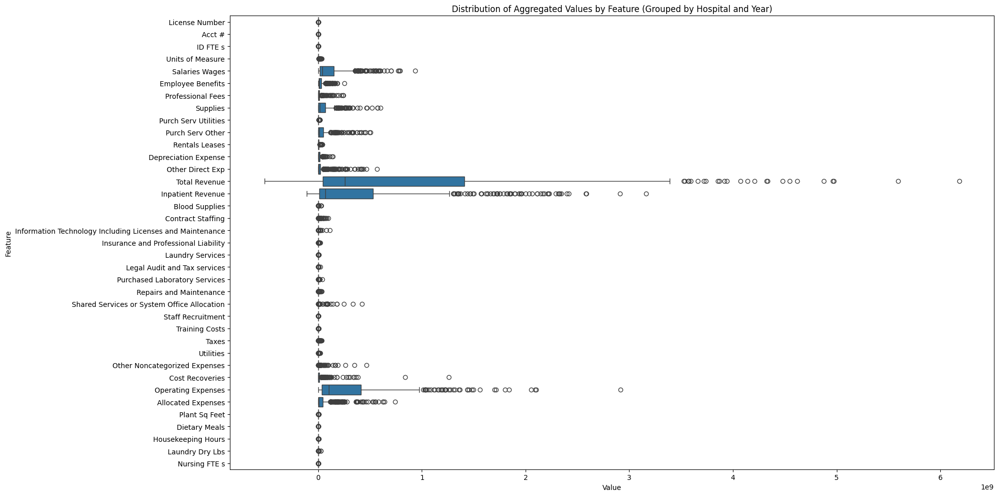

In [10]:
# Show distribution of aggregated values grouped by 'Hospital' and 'Year
df_grouped = df.groupby(['Hospital Name', 'Year'], as_index=False).sum(numeric_only=True)
df_melted = df_grouped.melt(id_vars=['Hospital Name', 'Year'], var_name='Feature', value_name='Value')

plt.figure(figsize=(20, 10))
sns.boxplot(data=df_melted, x='Value', y='Feature', orient='h')
plt.title("Distribution of Aggregated Values by Feature (Grouped by Hospital and Year)")
plt.xlabel("Value")
plt.tight_layout()
plt.show()

In [11]:
n_rows = len(df_agg)
summary = pd.DataFrame({
    'Zero Count': (df_agg == 0).sum(),
})
summary['Zero %'] = (summary['Zero Count'] / n_rows) * 100
summary = summary[(summary['Zero Count'] > 0) ]
summary = summary.sort_values(by='Zero Count', ascending=False)

summary.style.format({
    'Zero %': '{:.2f}%',
    'Zero Count': '{:,}'
})

,Zero Count,Zero %
Purchased Laboratory Services,518,91.52%
Utilities,517,91.34%
Shared Services or System Office Allocation,511,90.28%
Laundry Services,508,89.75%
Information Technology Including Licenses and Maintenance,508,89.75%
Blood Supplies,504,89.05%
Legal Audit and Tax services,502,88.69%
Staff Recruitment,484,85.51%
Contract Staffing,484,85.51%
Training Costs,476,84.10%


In [ ]:
df_agg.shape

(566, 55)

**Comment**: 32/55 columns had more than 37% of their values equal to zero. I best approach would be to binary encode these columns, instead of reporting a numerical cost we could encode them as 0 if their initial value was zero to represent the hospital does not offer this service. Code these columns as 1 if they had a numerical value, which says they offer this service.

In [12]:
# List of columns to binary encode
sparse_service_cols = [
    "Purchased Laboratory Services", "Utilities",
    "Shared Services or System Office Allocation", "Laundry Services",
    "Information Technology Including Licenses and Maintenance",
    "Blood Supplies", "Legal Audit and Tax services", "Staff Recruitment",
    "Contract Staffing", "Training Costs", "Taxes", "Repairs and Maintenance",
    "Insurance and Professional Liability", "Other Noncategorized Expenses",
    "Allocated Expenses", "Cost Recoveries"
]

# Generate new columns with binary encoded value. Columns will be labeled with '_flag' at the end for easier identification
for col in sparse_service_cols:
    df_agg[col + "_flag"] = (df_agg[col] > 0).astype(int)

# Drop original columns with large number of zero values
df_encoded = df_agg.drop(columns=sparse_service_cols)

**Note**: Ok to delete plot

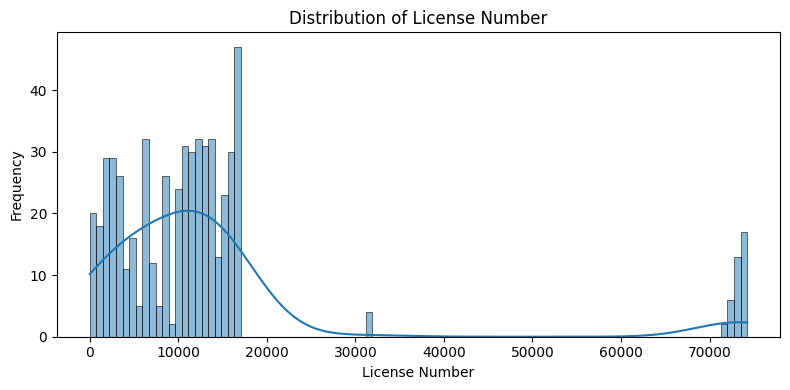

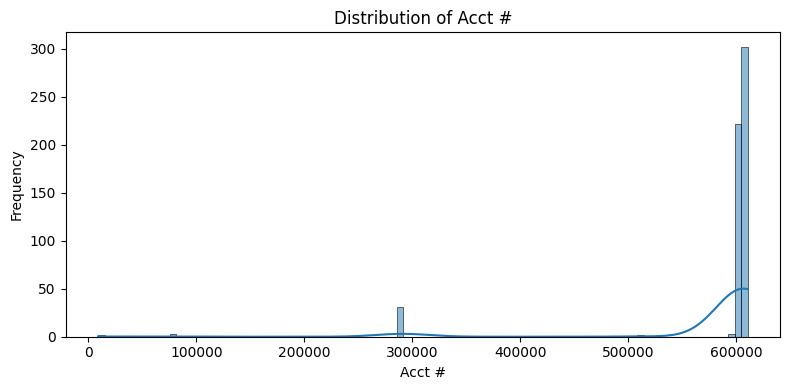

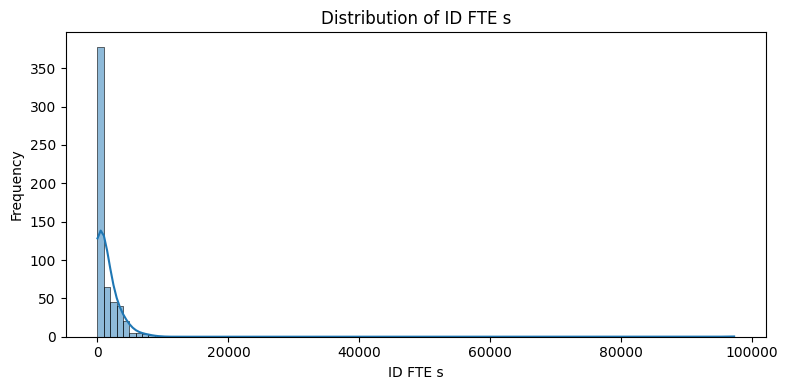

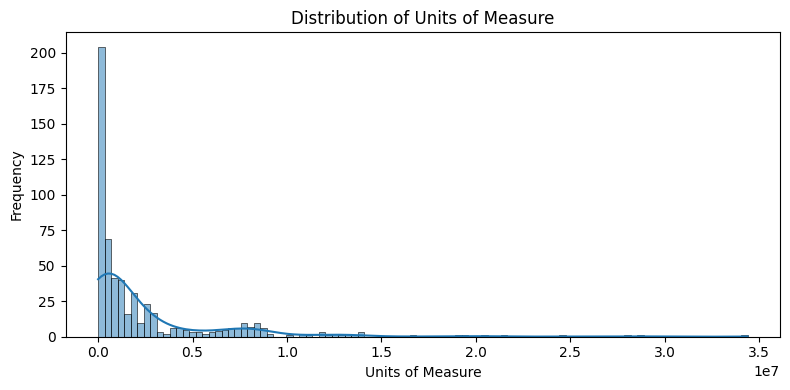

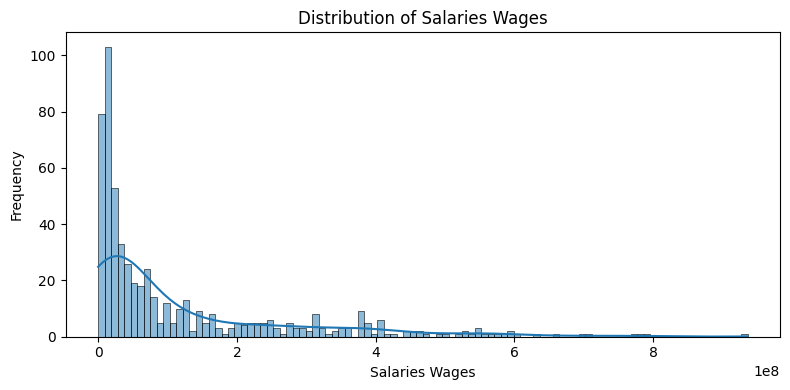

...

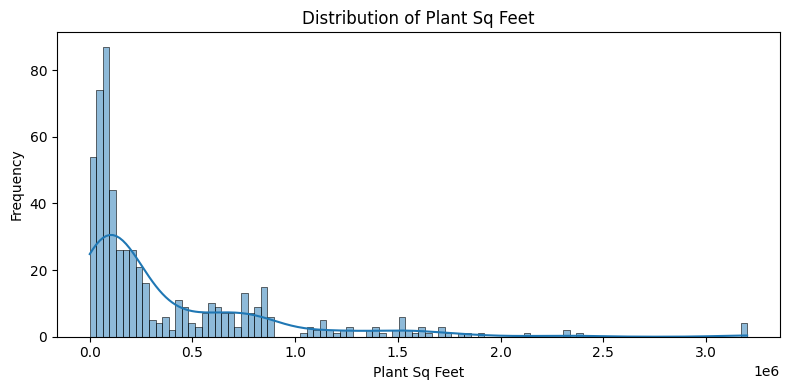

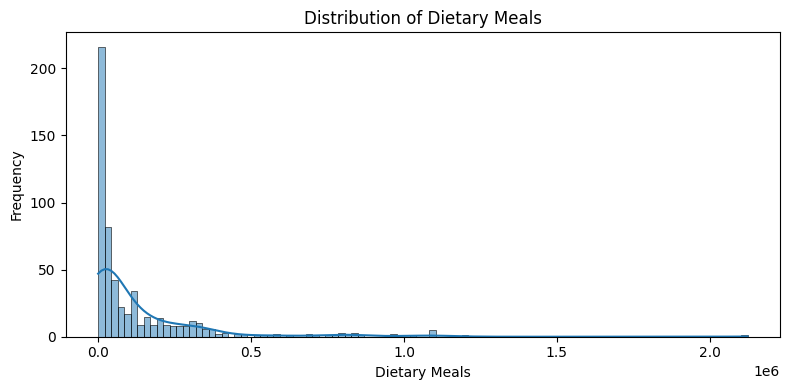

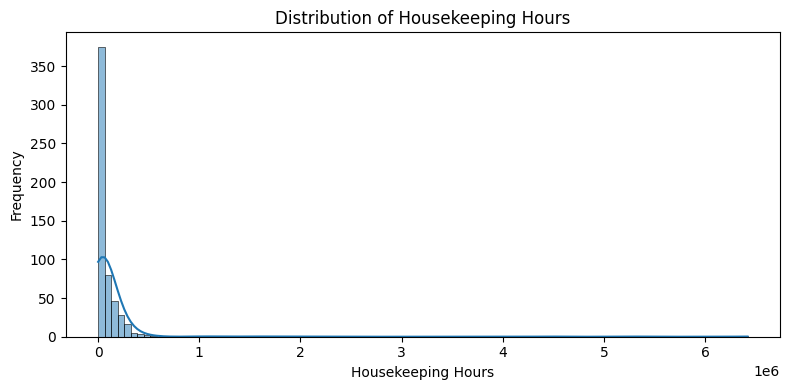

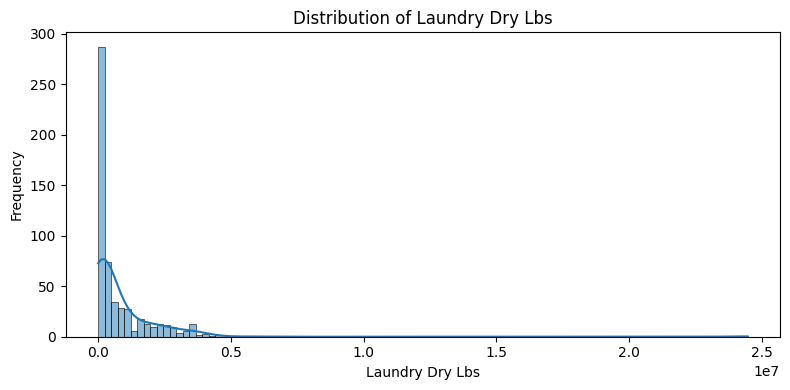

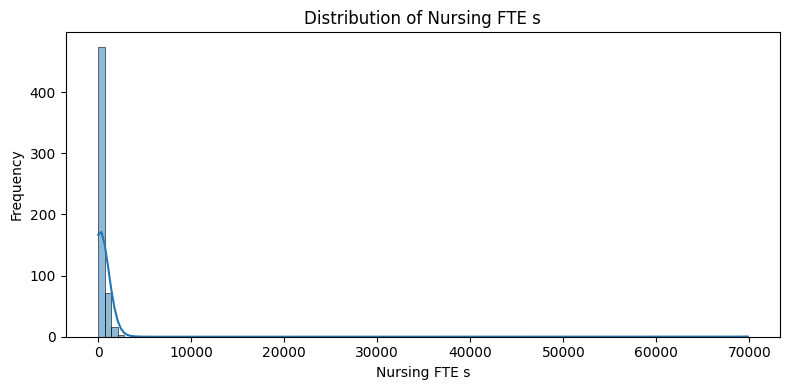

In [13]:
numeric_cols = [col for col in df_encoded.select_dtypes(include='number').columns if not col.endswith('_flag') and col not in ['Year']]

# Plot distribution for each
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_encoded[col], kde=True, bins=100)
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

Displaying a snip of the binary encoded and non-binary encoded table.

In [14]:
df_encoded.head(10)

,Hospital Name,Year,License Number,Acct #,ID FTE s,Units of Measure,Salaries Wages,Employee Benefits,Professional Fees,Supplies,...,Legal Audit and Tax services_flag,Staff Recruitment_flag,Contract Staffing_flag,Training Costs_flag,Taxes_flag,Repairs and Maintenance_flag,Insurance and Professional Liability_flag,Other Noncategorized Expenses_flag,Allocated Expenses_flag,Cost Recoveries_flag
0,ASTRIA TOPPENISH HOSPITAL,2020,6766,291190,45.57,99640,1988881,-1627202,3500,484780,...,0,0,0,0,0,0,0,0,0,0
1,ASTRIA TOPPENISH HOSPITAL,2021,6766,291190,59.88,98840,2307159,-953893,39630,597656,...,0,0,0,0,0,0,0,0,0,0
2,ASTRIA TOPPENISH HOSPITAL,2022,15721,601720,256.76,115137,21035918,4468660,4767567,5974762,...,0,0,1,0,1,1,1,1,0,0
3,ASTRIA TOPPENISH HOSPITAL,2023,15721,601720,233.13,104327,23073548,4466960,744897,6625476,...,0,0,1,0,1,1,1,1,0,0
4,Arbor Health,2019,13840,610720,50.00,274824,14806725,3468802,2117301,1893282,...,0,0,0,0,0,0,0,0,1,0
5,Arbor Health,2020,13840,610720,176.27,251459,17202430,3929505,1703174,2072897,...,0,0,0,0,0,0,0,0,1,0
6,Arbor Health,2021,13840,610720,199.00,264774,18707786,4143764,1380397,2330582,...,0,0,0,0,0,0,0,0,1,1
7,Arbor Health,2022,13667,601720,200.90,290075,21427371,3914496,1648430,2771740,...,0,0,0,0,0,0,0,0,0,0
8,Arbor Health,2023,13667,601720,205.00,302689,22446603,4452887,1453059,3068894,...,0,0,0,0,0,0,1,0,0,0
9,Astria Sunnyside Hospital,2019,15840,610720,473.32,693578,36116458,6817786,1156689,15276312,...,0,0,0,0,0,0,0,0,1,0


#### Remove categorical columns such as 'Hospital Name', 'Year', 'License Number', 'Acct #'

We will store this information as meta data for labeling in future plots.

In [15]:
# List of categorical columns.
meta_cols = ['Hospital Name', 'Year', 'License Number', 'Acct #']

# List of binary enconded columns
binary_cols = [col for col in df_encoded.columns if col.endswith('_flag')]

# List of numeric columns
numeric_cols = [col for col in df_encoded.columns if col not in meta_cols + binary_cols]

# Store metadata for categorical columns separately
df_meta = df_encoded[meta_cols].reset_index(drop=True)

# Scale only the selected numeric columns
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_encoded[numeric_cols]), columns=numeric_cols)

# Add binary encoded columns (unscaled)
df_scaled[binary_cols] = df_encoded[binary_cols].reset_index(drop=True)

In [26]:
meta_cols = ['Hospital Name', 'Year', 'License Number', 'Acct #']
binary_cols = [col for col in df_encoded.columns if col.endswith('_flag')]
numeric_cols = [col for col in df_encoded.columns if col not in meta_cols + binary_cols]

# Store metadata
df_meta = df_encoded[meta_cols].reset_index(drop=True)

# Scale both numeric and binary columns
scaler = StandardScaler()
scaled_values = scaler.fit_transform(df_encoded[numeric_cols + binary_cols])
df_scaled = pd.DataFrame(scaled_values, columns=numeric_cols + binary_cols)

#### Plot distribution of scaled data

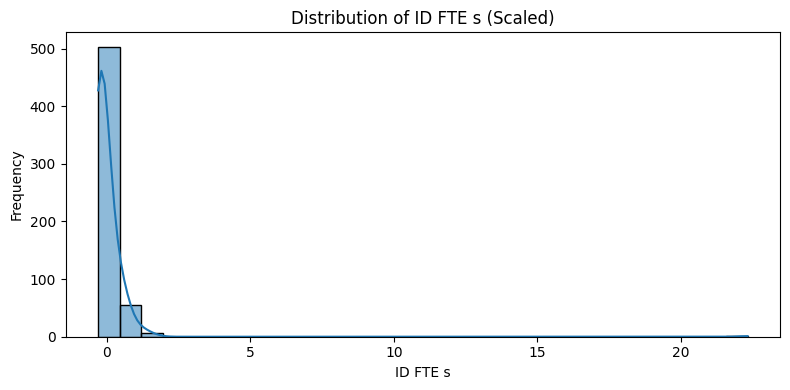

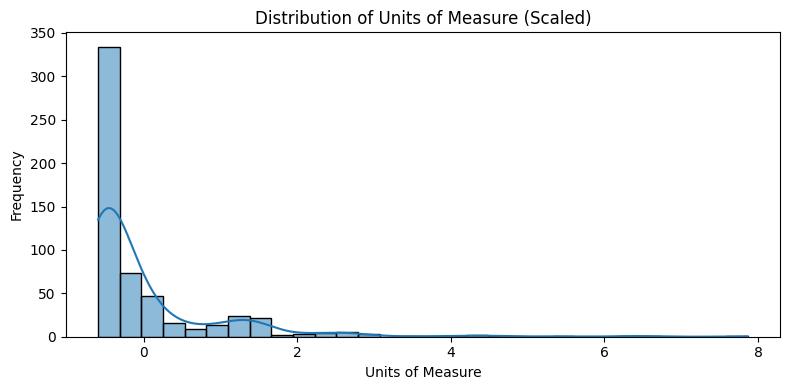

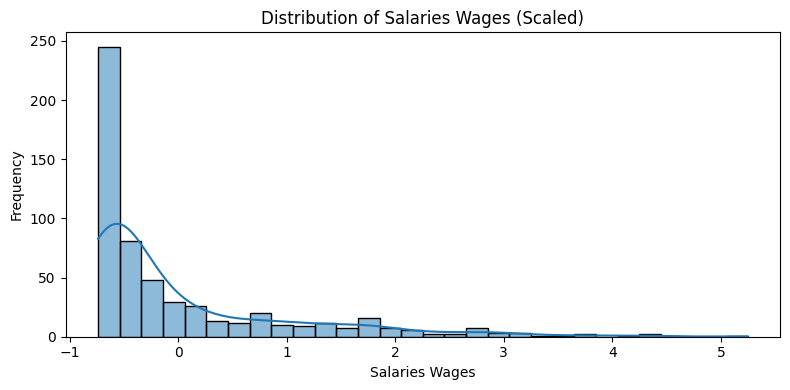

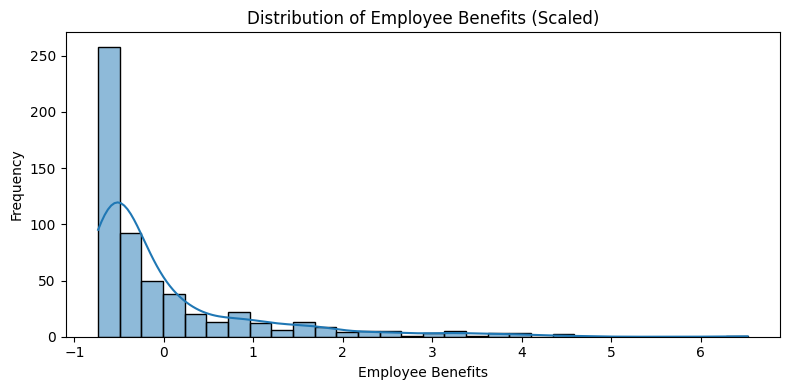

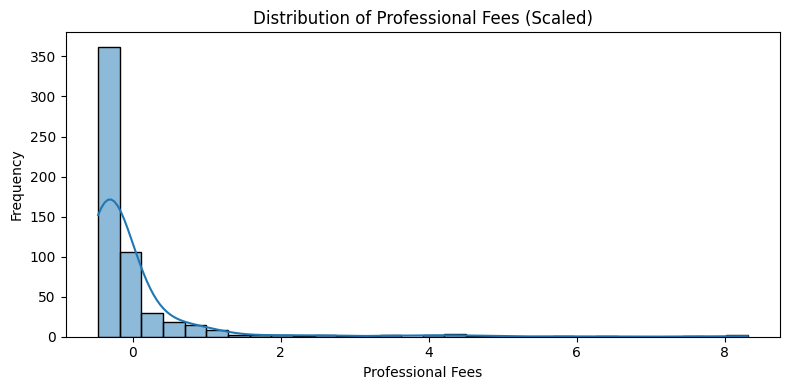

...

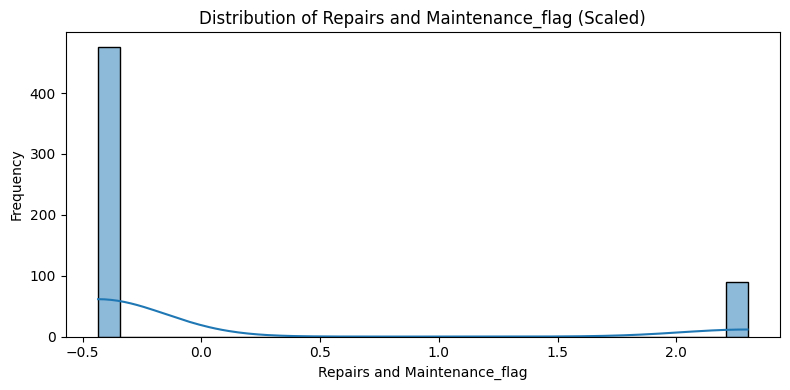

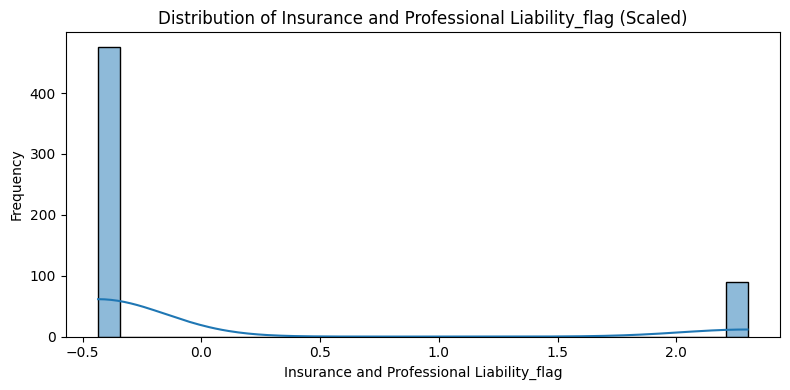

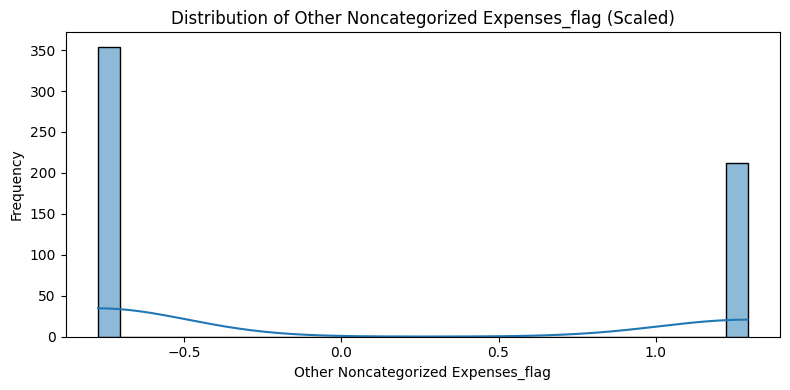

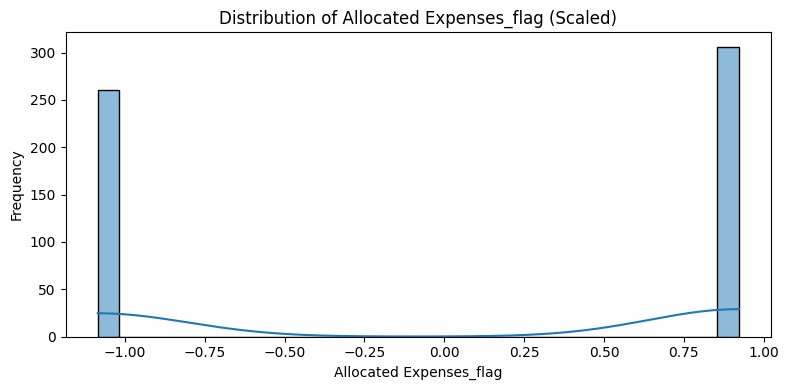

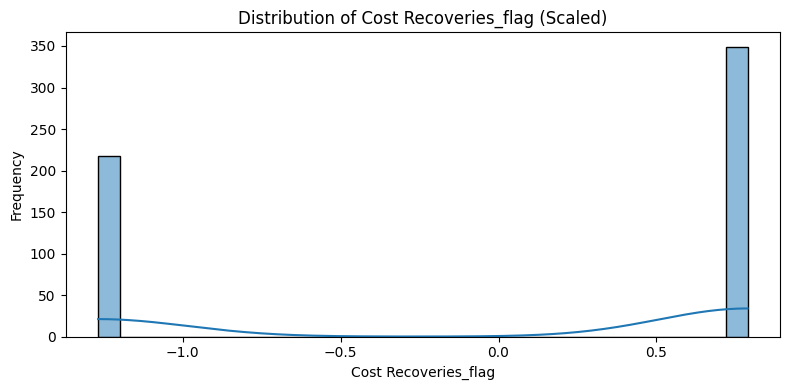

In [27]:
for col in df_scaled.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df_scaled[col], kde=True, bins=30)
    plt.title(f"Distribution of {col} (Scaled)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

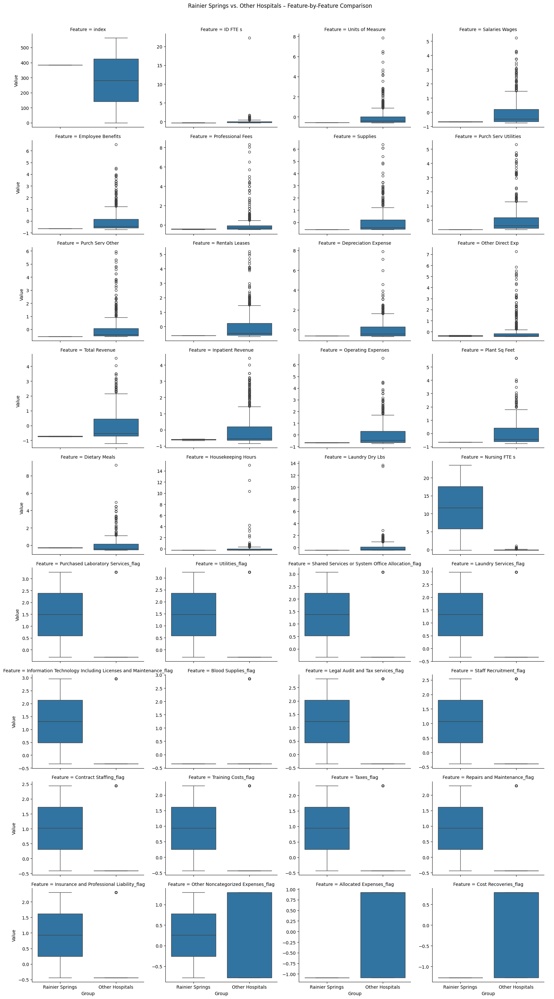

In [31]:
rainier_mask = df_meta['Hospital Name'] == 'Rainier Springs'
df_rainier = df_scaled[rainier_mask].copy()
df_other = df_scaled[~rainier_mask].copy()
df_rainier['Group'] = 'Rainier Springs'
df_other['Group'] = 'Other Hospitals'
df_combined = pd.concat([df_rainier, df_other])
df_melted = df_combined.reset_index().melt(id_vars='Group', var_name='Feature', value_name='Value')

g = sns.catplot(
    data=df_melted,
    x='Group',
    y='Value',
    col='Feature',
    col_wrap=4,
    kind='box',
    sharey=False,
    height=3.5,
    aspect=1.2
)
g.fig.subplots_adjust(top=0.95)
g.fig.suptitle("Rainier Springs vs. Other Hospitals – Feature-by-Feature Comparison")

plt.show()

## Hierarchical Clustering

In [17]:
!pip install ISLP


  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 98.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 45.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 96.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 62.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 101.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.8 MB/s eta 0:00:00
 

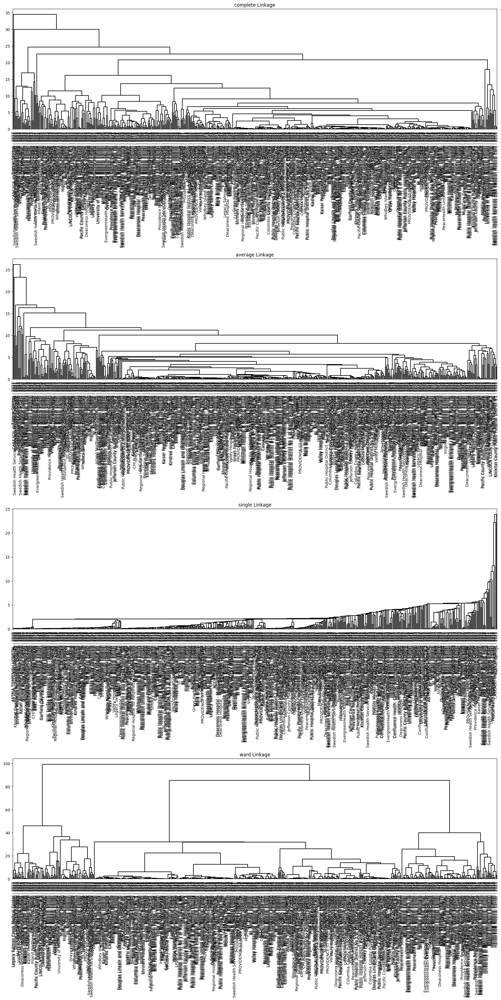

In [28]:
from ISLP.cluster import compute_linkage

labels = df_meta['Hospital Name'] + " - " + df_meta['Year'].astype(str)

# def compute_linkage(model):
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count
#     linkage_matrix = np.column_stack([
#         model.children_, model.distances_, counts
#     ]).astype(float)
#     return linkage_matrix

def plot_nci(linkage_method, ax, cut=-np.inf):
    hc = AgglomerativeClustering(
        n_clusters=None,
        distance_threshold=0,
        linkage=linkage_method.lower()
    ).fit(df_scaled)

    linkage_ = compute_linkage(hc)
    dendrogram(
        linkage_,
        ax=ax,
        labels=labels.to_list(),
        leaf_font_size=10,
        color_threshold=cut,
        above_threshold_color='black'
    )
    ax.set_title(f"{linkage_method} Linkage")
    return hc

fig, axes = plt.subplots(4, 1, figsize=(18, 36), constrained_layout=True)
plot_nci('complete', axes[0])
plot_nci('average', axes[1])
plot_nci('single', axes[2])
plot_nci('ward', axes[3])
plt.show()

Complete Linkage
- Good separation with some distinct clusters.
- No clear cut point, maybe something around ~15–20.

Average Linkage
- Smooth and ~balanced.
- We can observe some good ~3–6 clusters.

Single Linkage
- Long chaining effect.
- Not ideal for data

**Ward Linkage**
- Most structured, variance-minimizing clustering.
- Major merges happen around height 60–80.
- Tall merges (high height) point to the clusters being joined are far apart → strong separation.






Linkage: ward
Clusters: 2, Silhouette Score: 0.476
Clusters: 3, Silhouette Score: 0.419
Clusters: 4, Silhouette Score: 0.420
Clusters: 5, Silhouette Score: 0.386
Clusters: 6, Silhouette Score: 0.392
Clusters: 7, Silhouette Score: 0.393
Clusters: 8, Silhouette Score: 0.398
Clusters: 9, Silhouette Score: 0.402
Clusters: 10, Silhouette Score: 0.275
Clusters: 11, Silhouette Score: 0.281
Clusters: 12, Silhouette Score: 0.293
Clusters: 13, Silhouette Score: 0.301
Clusters: 14, Silhouette Score: 0.303

Linkage: complete
Clusters: 2, Silhouette Score: 0.735
Clusters: 3, Silhouette Score: 0.706
Clusters: 4, Silhouette Score: 0.516
Clusters: 5, Silhouette Score: 0.521
Clusters: 6, Silhouette Score: 0.522
Clusters: 7, Silhouette Score: 0.521
Clusters: 8, Silhouette Score: 0.503
Clusters: 9, Silhouette Score: 0.467
Clusters: 10, Silhouette Score: 0.467
Clusters: 11, Silhouette Score: 0.417
Clusters: 12, Silhouette Score: 0.420
Clusters: 13, Silhouette Score: 0.419
Clusters: 14, Silhouette Score: 

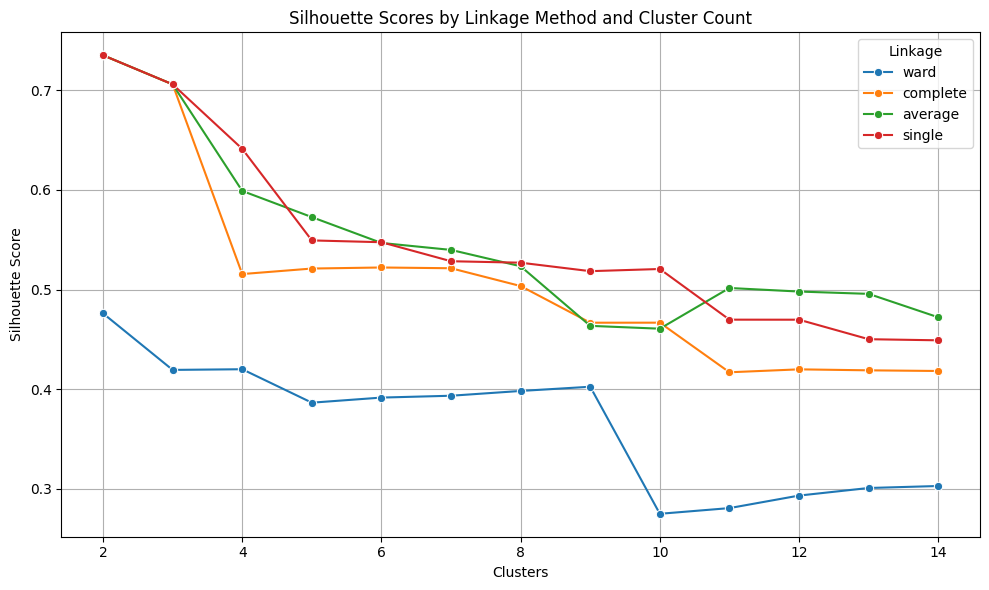

In [29]:
linkage_methods = ['ward', 'complete', 'average', 'single']
results = []

for linkage in linkage_methods:
    print(f"\nLinkage: {linkage}")
    for k in range(2, 15):
        try:
            model = AgglomerativeClustering(n_clusters=k, linkage=linkage)
            labels = model.fit_predict(df_scaled)
            score = silhouette_score(df_scaled, labels)
            results.append({'Linkage': linkage, 'Clusters': k, 'Silhouette Score': score})
            print(f"Clusters: {k}, Silhouette Score: {score:.3f}")
        except Exception as e:
            print(f"Clusters: {k}, Error: {e}")

# Convert results to DataFrame for plotting or further analysis
df_silhouette = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_silhouette, x='Clusters', y='Silhouette Score', hue='Linkage', marker='o')
plt.title("Silhouette Scores by Linkage Method and Cluster Count")
plt.grid(True)
plt.tight_layout()
plt.show()

In [30]:
model = AgglomerativeClustering(n_clusters=2, linkage='average')
labels = model.fit_predict(df_scaled)
df_meta['Cluster'] = labels
df_meta['Cluster'].value_counts()

# Inspect isolated hospital
df_meta[df_meta['Cluster'] == df_meta['Cluster'].value_counts().idxmin()]

,Hospital Name,Year,License Number,Acct #,Cluster
385,Rainier Springs,2023,73075,601720,1


In [24]:
avg_model = AgglomerativeClustering(n_clusters=2, linkage='average')
avg_labels = avg_model.fit_predict(df_scaled)

# Merge labels into metadata
df_meta_avg = df_meta.copy()
df_meta_avg['Cluster'] = avg_labels

# Count how many hospitals are in each cluster
print(df_meta_avg['Cluster'].value_counts())

# Get the hospital(s) in the smaller cluster
df_meta_avg[df_meta_avg['Cluster'] == df_meta_avg['Cluster'].value_counts().idxmin()]


Cluster
0    565
1      1
Name: count, dtype: int64


,Hospital Name,Year,License Number,Acct #,Cluster
385,Rainier Springs,2023,73075,601720,1


In [25]:
df_scaled.loc[df_meta['Hospital Name'] == 'Rainier Springs']


,ID FTE s,Units of Measure,Salaries Wages,Employee Benefits,Professional Fees,Supplies,Purch Serv Utilities,Purch Serv Other,Rentals Leases,Depreciation Expense,...,Legal Audit and Tax services_flag,Staff Recruitment_flag,Contract Staffing_flag,Training Costs_flag,Taxes_flag,Repairs and Maintenance_flag,Insurance and Professional Liability_flag,Other Noncategorized Expenses_flag,Allocated Expenses_flag,Cost Recoveries_flag
384,-0.274733,-0.563551,-0.668670,-0.633979,-0.373287,-0.598535,-0.676143,-0.540599,-0.621924,-0.619933,...,0,0,0,0,0,0,0,0,0,0
385,-0.272199,-0.559140,-0.657038,-0.631406,-0.447262,-0.594140,-0.676143,-0.535172,-0.621924,-0.625648,...,1,1,1,1,1,1,1,1,0,0


### Rainier Springs Outlier Nursing FTEs

The value of Nursing FTEs was really high for Rainier Springs in 2023. This is likely a error.

In [32]:
df.loc[
    (df['Year'] == 2023) &
    (df['License Number'] == 925) &
    (df['Hospital Name'].str.strip() == 'Rainier Springs') &
    (df['Cost Center'].str.strip() == 'Psychiatric Care') &
    (df['Nursing FTE s'] > 10000),
    'Nursing FTE s'
] = np.nan

meta_cols = ['Hospital Name', 'Year', 'License Number', 'Acct #', 'Cost Center']
df_numeric = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')
df_agg = pd.concat([df[['Hospital Name', 'Year']], df_numeric], axis=1)
df_agg = df_agg.groupby(['Hospital Name', 'Year']).sum(numeric_only=True).reset_index()

sparse_service_cols = [
    "Purchased Laboratory Services", "Utilities",
    "Shared Services or System Office Allocation", "Laundry Services",
    "Information Technology Including Licenses and Maintenance",
    "Blood Supplies", "Legal Audit and Tax services", "Staff Recruitment",
    "Contract Staffing", "Training Costs", "Taxes", "Repairs and Maintenance",
    "Insurance and Professional Liability", "Other Noncategorized Expenses",
    "Allocated Expenses", "Cost Recoveries"
]
for col in sparse_service_cols:
    df_agg[col + "_flag"] = (df_agg[col] > 0).astype(int)

df_encoded = df_agg.drop(columns=sparse_service_cols)

binary_cols = [col for col in df_encoded.columns if col.endswith('_flag')]
meta_cols_encoded = ['Hospital Name', 'Year']
numeric_cols = [col for col in df_encoded.columns if col not in meta_cols_encoded + binary_cols]

df_meta = df_encoded[meta_cols_encoded].reset_index(drop=True)
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_encoded[numeric_cols + binary_cols]), columns=numeric_cols + binary_cols)

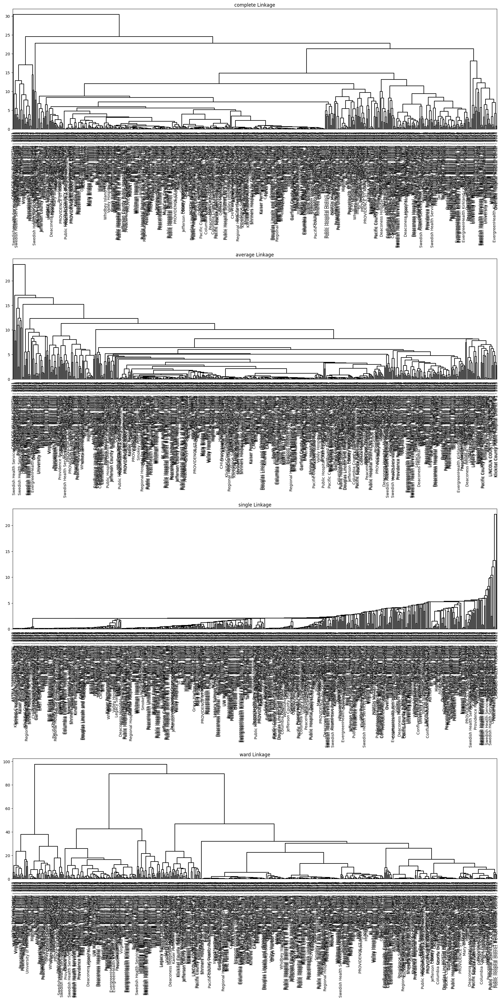

In [36]:
from ISLP.cluster import compute_linkage

labels = df_meta['Hospital Name'] + " - " + df_meta['Year'].astype(str)

# def compute_linkage(model):
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count
#     linkage_matrix = np.column_stack([
#         model.children_, model.distances_, counts
#     ]).astype(float)
#     return linkage_matrix

def plot_nci(linkage_method, ax, cut=-np.inf):
    hc = AgglomerativeClustering(
        n_clusters=None,
        distance_threshold=0,
        linkage=linkage_method.lower()
    ).fit(df_scaled)

    linkage_ = compute_linkage(hc)
    dendrogram(
        linkage_,
        ax=ax,
        labels=labels.to_list(),
        leaf_font_size=10,
        color_threshold=cut,
        above_threshold_color='black'
    )
    ax.set_title(f"{linkage_method} Linkage")
    return hc

fig, axes = plt.subplots(4, 1, figsize=(18, 36), constrained_layout=True)
plot_nci('complete', axes[0])
plot_nci('average', axes[1])
plot_nci('single', axes[2])
plot_nci('ward', axes[3])
plt.show()

In [37]:
avg_model = AgglomerativeClustering(n_clusters=2, linkage='average')
avg_labels = avg_model.fit_predict(df_scaled)

# Merge labels into metadata
df_meta_avg = df_meta.copy()
df_meta_avg['Cluster'] = avg_labels

# Count how many hospitals are in each cluster
print(df_meta_avg['Cluster'].value_counts())

# Get the hospital(s) in the smaller cluster
df_meta_avg[df_meta_avg['Cluster'] == df_meta_avg['Cluster'].value_counts().idxmin()]

Cluster
0    565
1      1
Name: count, dtype: int64


,Hospital Name,Year,Cluster
37,CASCADE VALLEY HOSPITAL,2021,1


In [38]:
avg_model = AgglomerativeClustering(n_clusters=2, linkage='complete')
avg_labels = avg_model.fit_predict(df_scaled)

# Merge labels into metadata
df_meta_avg = df_meta.copy()
df_meta_avg['Cluster'] = avg_labels

# Count how many hospitals are in each cluster
print(df_meta_avg['Cluster'].value_counts())

# Get the hospital(s) in the smaller cluster
df_meta_avg[df_meta_avg['Cluster'] == df_meta_avg['Cluster'].value_counts().idxmin()]

Cluster
0    565
1      1
Name: count, dtype: int64


,Hospital Name,Year,Cluster
37,CASCADE VALLEY HOSPITAL,2021,1


In [40]:
model = AgglomerativeClustering(n_clusters=2, linkage='average')
cluster_labels = model.fit_predict(df_scaled)

df_meta['Cluster'] = cluster_labels

outlier_mask = (
    (df_meta['Cluster'] == df_meta['Cluster'].value_counts().idxmin()) &
    (df_meta['Hospital Name'] == 'CASCADE VALLEY HOSPITAL') &
    (df_meta['Year'] == 2021)
)

cascade_row = df_scaled[outlier_mask].iloc[0]
others_mean = df_scaled[~outlier_mask].mean()
diff = (cascade_row - others_mean).abs().sort_values(ascending=False)
diff.head(10)

,0
ID FTE s,22.364541
Other Noncategorized Expenses_flag,1.294499
Cost Recoveries_flag,1.270430
Allocated Expenses_flag,1.086781
Operating Expenses,0.607017
Depreciation Expense,0.598350
Salaries Wages,0.578743
Plant Sq Feet,0.577989
Inpatient Revenue,0.567528
Total Revenue,0.561735


In [41]:
df[
    (df['Hospital Name'].str.strip() == 'CASCADE VALLEY HOSPITAL') &
    (df['Year'] == 2021)
][['Cost Center', 'ID FTE s']]

,Cost Center,ID FTE s
14496,ICU or Combined ICU-CCU,13.05
14501,Semi-Intensive & Intermediate Care,0.00
14508,Acute Care,32.50
14513,Alternative Birth Ctr,9.53
14520,Physical Rehab,0.00
...,...,...
14944,Nursing Float Personnel,0.00
14952,Inservice - Nursing,0.00
14956,Comm. Health Education,0.00
14964,Other Admin Services,0.00


### Rainier Springs Outlier ID FTEs

The value of ID FTEs was really high for Rainier Springs in 2023. This is likely a error.

In [42]:
df.loc[
    (df['Year'] == 2021) &
    (df['License Number'] == 106) &
    (df['Hospital Name'].str.strip() == 'CASCADE VALLEY HOSPITAL') &
    (df['Cost Center'].str.strip() == 'Laboratory (Including Blood Bank)') &
    (df['ID FTE s'] > 10000),
    'ID FTE s'
] = np.nan

df.loc[
    (df['Year'] == 2023) &
    (df['License Number'] == 925) &
    (df['Hospital Name'].str.strip() == 'Rainier Springs') &
    (df['Cost Center'].str.strip() == 'Psychiatric Care') &
    (df['Nursing FTE s'] > 10000),
    'Nursing FTE s'
] = np.nan

meta_cols = ['Hospital Name', 'Year', 'License Number', 'Acct #', 'Cost Center']
df_numeric = df.drop(columns=meta_cols).apply(pd.to_numeric, errors='coerce')
df_agg = pd.concat([df[['Hospital Name', 'Year']], df_numeric], axis=1)
df_agg = df_agg.groupby(['Hospital Name', 'Year']).sum(numeric_only=True).reset_index()

sparse_service_cols = [
    "Purchased Laboratory Services", "Utilities",
    "Shared Services or System Office Allocation", "Laundry Services",
    "Information Technology Including Licenses and Maintenance",
    "Blood Supplies", "Legal Audit and Tax services", "Staff Recruitment",
    "Contract Staffing", "Training Costs", "Taxes", "Repairs and Maintenance",
    "Insurance and Professional Liability", "Other Noncategorized Expenses",
    "Allocated Expenses", "Cost Recoveries"
]
for col in sparse_service_cols:
    df_agg[col + "_flag"] = (df_agg[col] > 0).astype(int)

df_encoded = df_agg.drop(columns=sparse_service_cols)

binary_cols = [col for col in df_encoded.columns if col.endswith('_flag')]
meta_cols_encoded = ['Hospital Name', 'Year']
numeric_cols = [col for col in df_encoded.columns if col not in meta_cols_encoded + binary_cols]

df_meta = df_encoded[meta_cols_encoded].reset_index(drop=True)
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df_encoded[numeric_cols + binary_cols]), columns=numeric_cols + binary_cols)

## Re-Analysis after removing Outliers

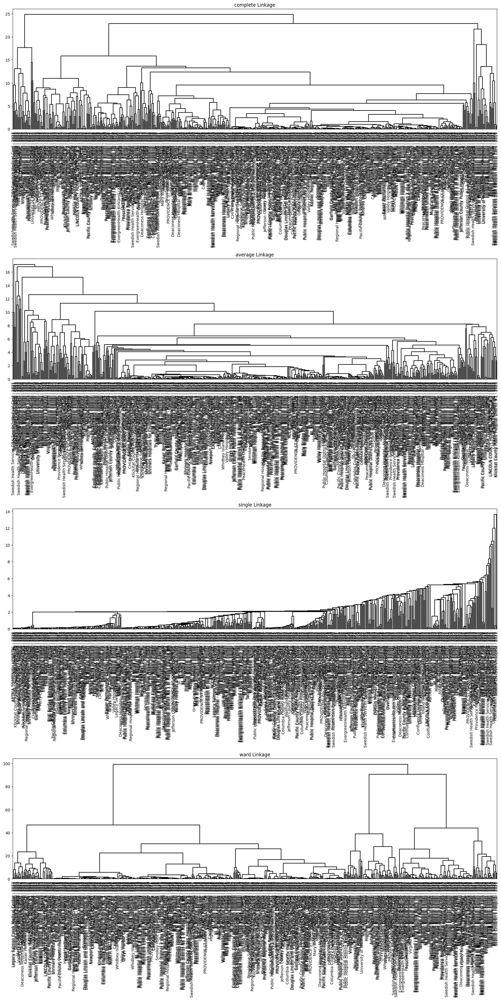

In [43]:
from ISLP.cluster import compute_linkage

labels = df_meta['Hospital Name'] + " - " + df_meta['Year'].astype(str)

# def compute_linkage(model):
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count
#     linkage_matrix = np.column_stack([
#         model.children_, model.distances_, counts
#     ]).astype(float)
#     return linkage_matrix

def plot_nci(linkage_method, ax, cut=-np.inf):
    hc = AgglomerativeClustering(
        n_clusters=None,
        distance_threshold=0,
        linkage=linkage_method.lower()
    ).fit(df_scaled)

    linkage_ = compute_linkage(hc)
    dendrogram(
        linkage_,
        ax=ax,
        labels=labels.to_list(),
        leaf_font_size=10,
        color_threshold=cut,
        above_threshold_color='black'
    )
    ax.set_title(f"{linkage_method} Linkage")
    return hc

fig, axes = plt.subplots(4, 1, figsize=(18, 36), constrained_layout=True)
plot_nci('complete', axes[0])
plot_nci('average', axes[1])
plot_nci('single', axes[2])
plot_nci('ward', axes[3])
plt.show()


Linkage: ward
Clusters: 2, Silhouette Score: 0.397
Clusters: 3, Silhouette Score: 0.428
Clusters: 4, Silhouette Score: 0.403
Clusters: 5, Silhouette Score: 0.388
Clusters: 6, Silhouette Score: 0.393
Clusters: 7, Silhouette Score: 0.399
Clusters: 8, Silhouette Score: 0.272
Clusters: 9, Silhouette Score: 0.276
Clusters: 10, Silhouette Score: 0.287
Clusters: 11, Silhouette Score: 0.295
Clusters: 12, Silhouette Score: 0.297
Clusters: 13, Silhouette Score: 0.303
Clusters: 14, Silhouette Score: 0.305

Linkage: complete
Clusters: 2, Silhouette Score: 0.514
Clusters: 3, Silhouette Score: 0.516
Clusters: 4, Silhouette Score: 0.508
Clusters: 5, Silhouette Score: 0.507
Clusters: 6, Silhouette Score: 0.497
Clusters: 7, Silhouette Score: 0.437
Clusters: 8, Silhouette Score: 0.437
Clusters: 9, Silhouette Score: 0.402
Clusters: 10, Silhouette Score: 0.405
Clusters: 11, Silhouette Score: 0.418
Clusters: 12, Silhouette Score: 0.417
Clusters: 13, Silhouette Score: 0.405
Clusters: 14, Silhouette Score: 

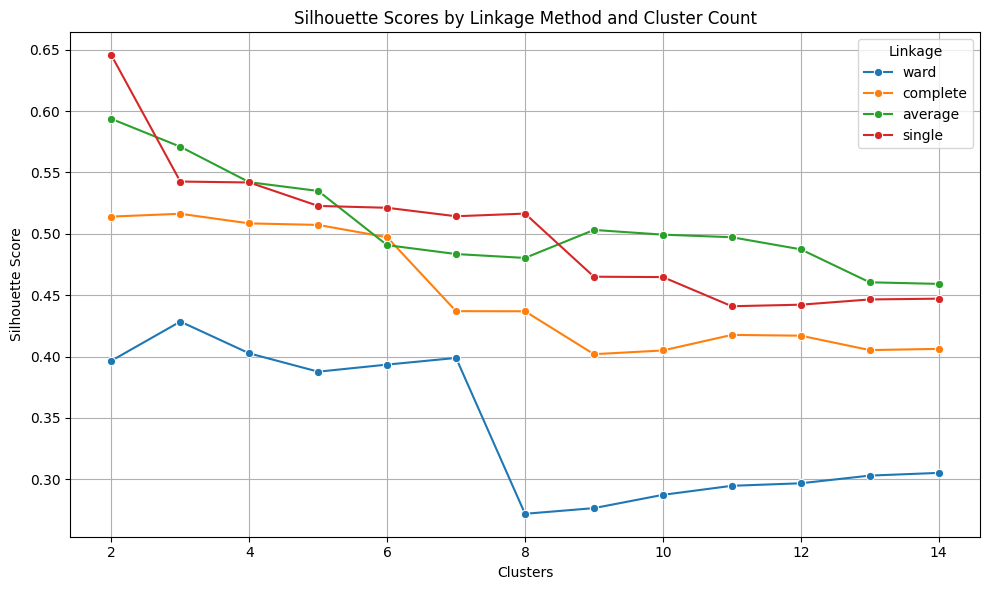

In [44]:
linkage_methods = ['ward', 'complete', 'average', 'single']
results = []

for linkage in linkage_methods:
    print(f"\nLinkage: {linkage}")
    for k in range(2, 15):
        try:
            model = AgglomerativeClustering(n_clusters=k, linkage=linkage)
            labels = model.fit_predict(df_scaled)
            score = silhouette_score(df_scaled, labels)
            results.append({'Linkage': linkage, 'Clusters': k, 'Silhouette Score': score})
            print(f"Clusters: {k}, Silhouette Score: {score:.3f}")
        except Exception as e:
            print(f"Clusters: {k}, Error: {e}")

# Convert results to DataFrame for plotting or further analysis
df_silhouette = pd.DataFrame(results)

plt.figure(figsize=(10, 6))
sns.lineplot(data=df_silhouette, x='Clusters', y='Silhouette Score', hue='Linkage', marker='o')
plt.title("Silhouette Scores by Linkage Method and Cluster Count")
plt.grid(True)
plt.tight_layout()
plt.show()

Single Linkage
- Highest peak at k = 2 with a silhouette score of ~0.65
- "Chaining" (long, loose clusters)
- Drops  after k = 2, poor structure beyond 2 clusters

Average Linkage
- Strong and stable performance from k = 2 to 6
- Silhouette scores stay around 0.50–0.59
- There seems to be good separation

Complete Linkage
- Similar trend to average but slightly lower scores
- More sensitive to outliers and tends to produce tighter clusters, but with less separation

Ward Linkage
- Lowest silhouette scores across the board (mostly < 0.43)
- Ward often creates balanced, compact clusters, making it useful for well-scaled and dense data



Best separation: use average linkage with k = 2–4

For Tight, Compact clusters: Ward with k = 3–4 is still usable

Avoiding using single linkage for more than 2 clusters

In [59]:
def k_clusters(df_scaled, df_meta, linkage='complete', k_range=range(2, 11)):
    for k in k_range:
        model = AgglomerativeClustering(n_clusters=k, linkage=linkage)
        df_meta['Cluster'] = model.fit_predict(df_scaled)

        pca = PCA(n_components=2)
        X_pca = pca.fit_transform(df_scaled)
        df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
        df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

        plt.figure(figsize=(8, 5))
        sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
        plt.title(f'PCA Projection - {linkage.capitalize()} Linkage (k={k})')
        plt.grid(True)
        plt.tight_layout()
        plt.show()


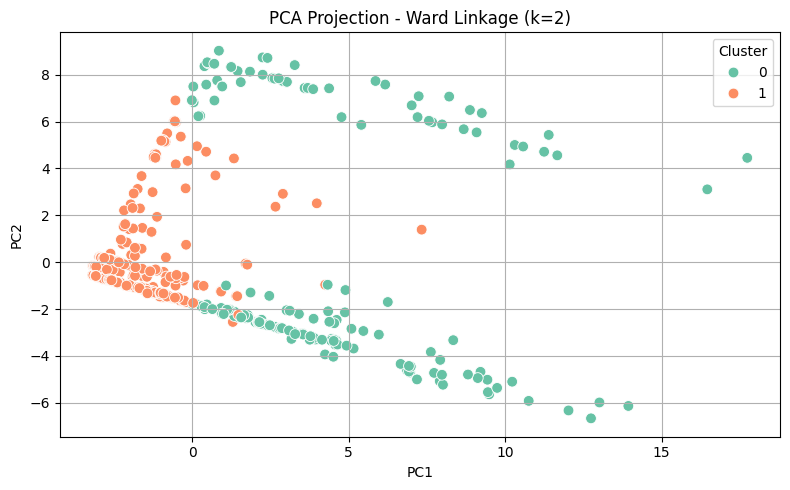

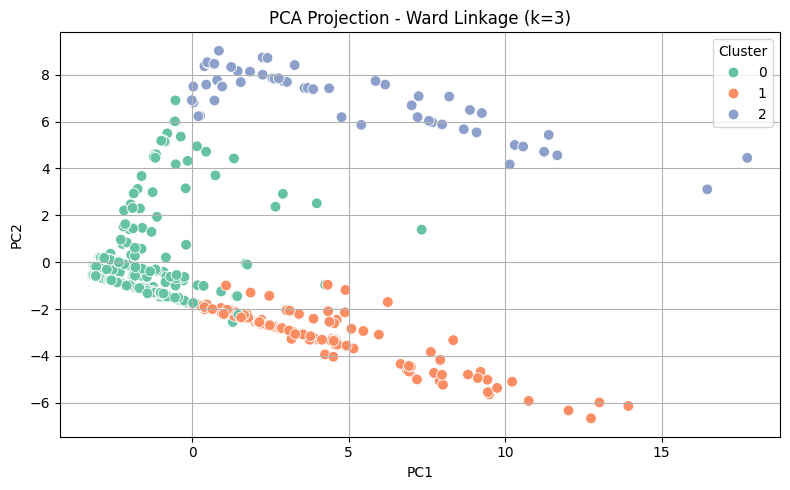

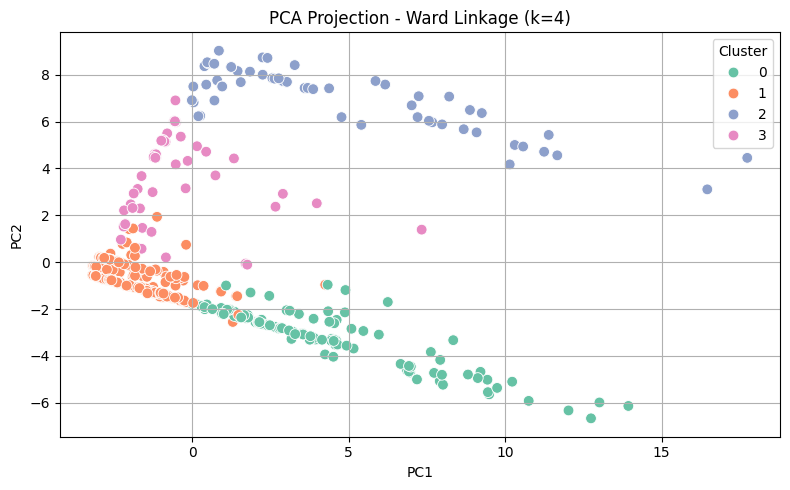

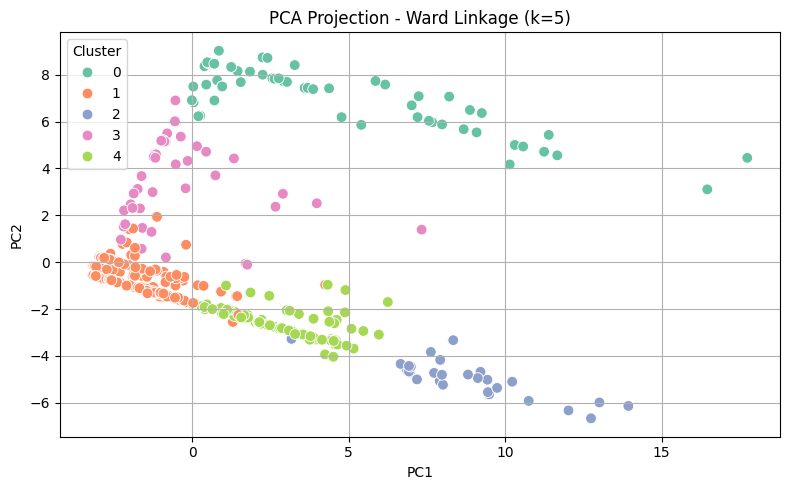

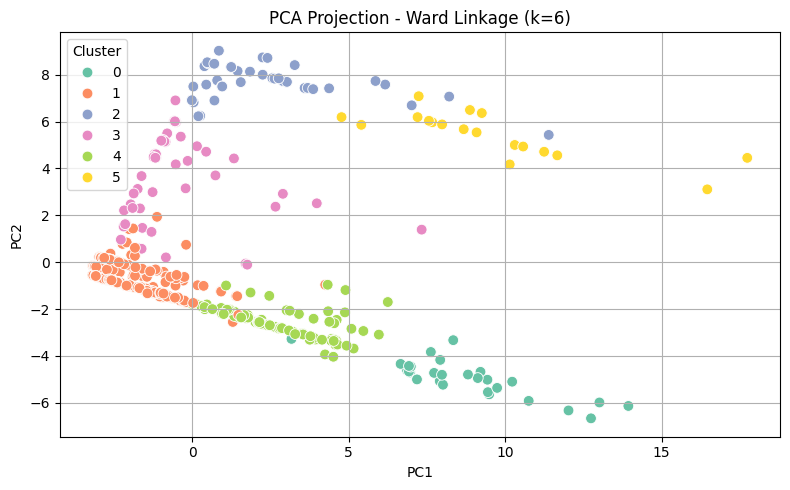

...

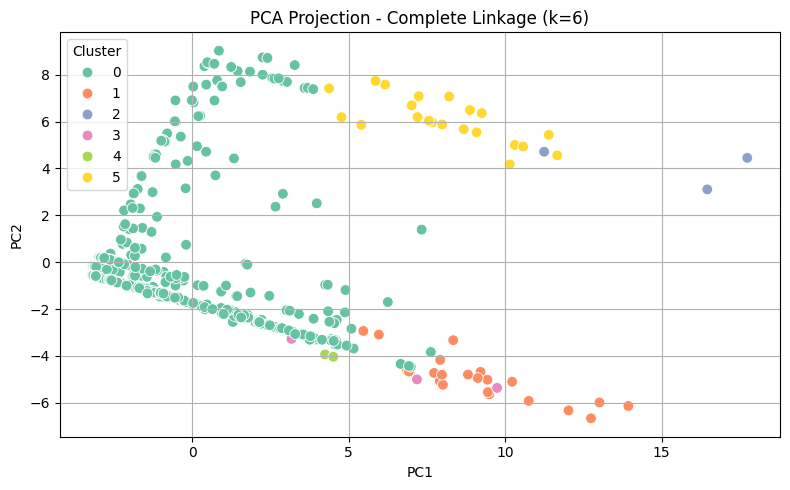

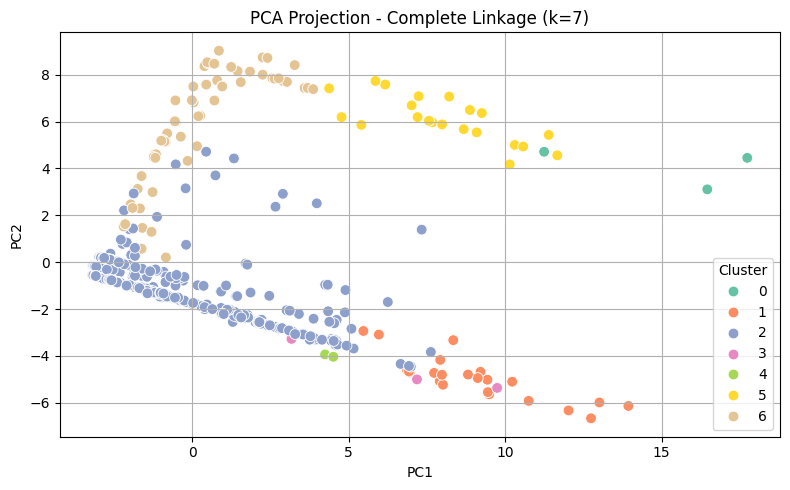

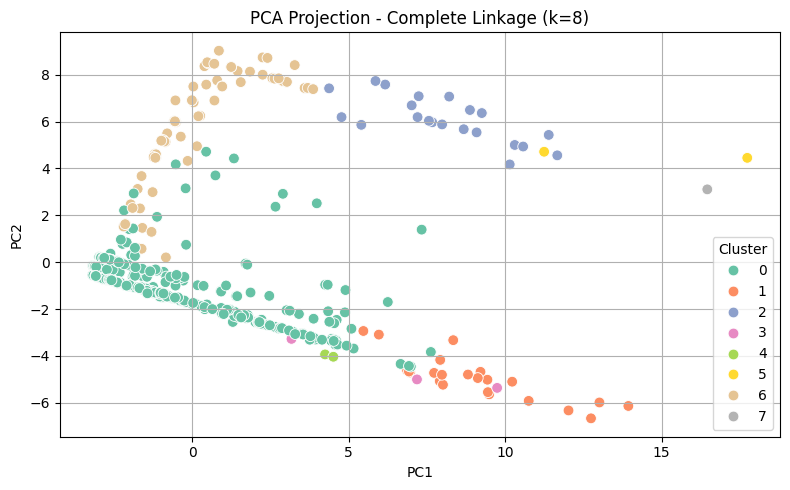

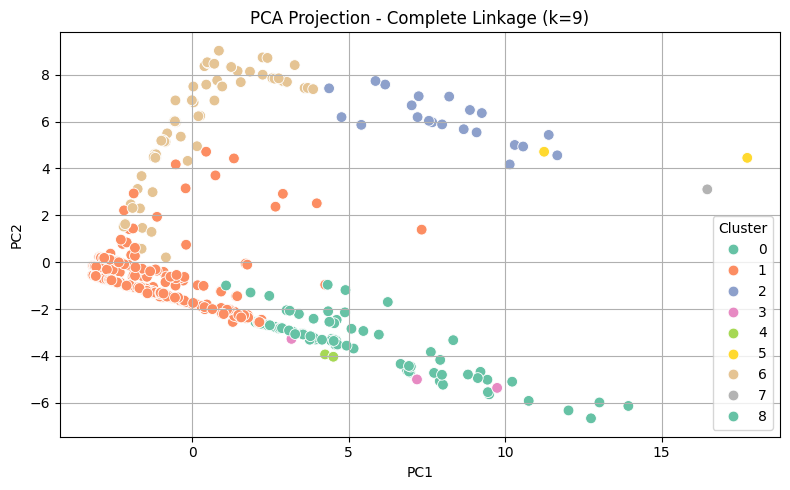

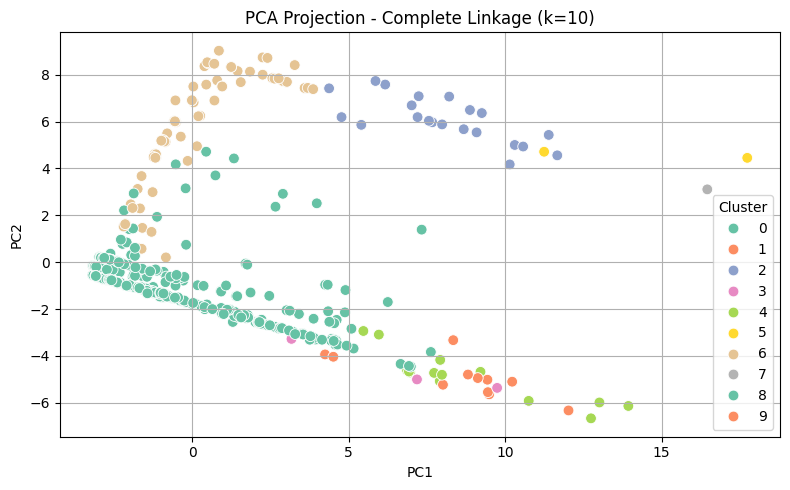

In [60]:
k_clusters(df_scaled, df_meta, linkage='ward')
k_clusters(df_scaled, df_meta, linkage='average')
k_clusters(df_scaled, df_meta, linkage='complete')

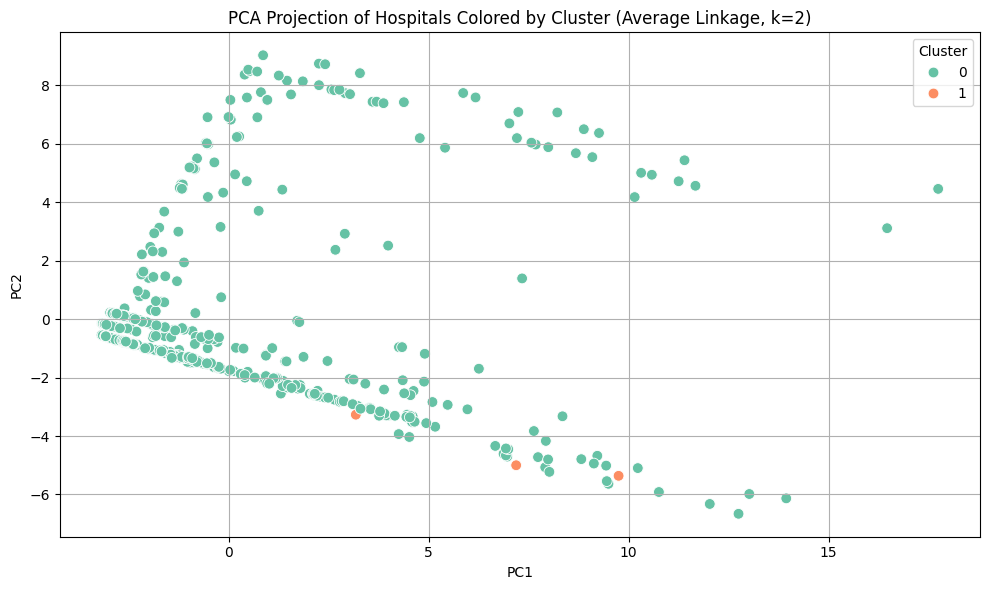

In [54]:
model_avg = AgglomerativeClustering(n_clusters=2, linkage='average')
df_meta['Cluster'] = model_avg.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Average Linkage, k=2)')
plt.grid(True)
plt.tight_layout()
plt.show()

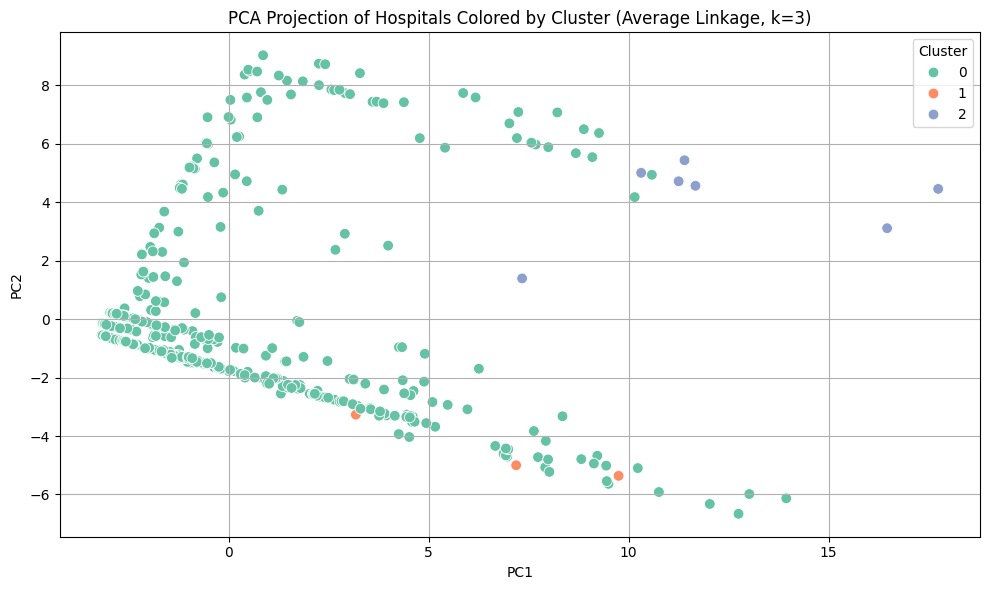

In [55]:
model_avg = AgglomerativeClustering(n_clusters=3, linkage='average')
df_meta['Cluster'] = model_avg.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Average Linkage, k=3)')
plt.grid(True)
plt.tight_layout()
plt.show()

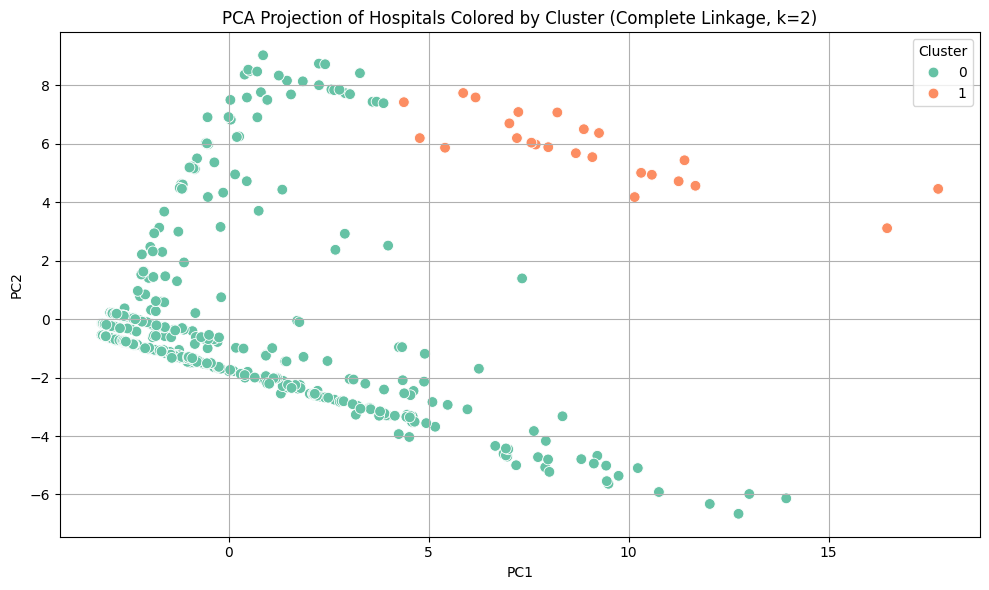

In [56]:
model_com = AgglomerativeClustering(n_clusters=2, linkage='complete')
df_meta['Cluster'] = model_com.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Complete Linkage, k=2)')
plt.grid(True)
plt.tight_layout()
plt.show()

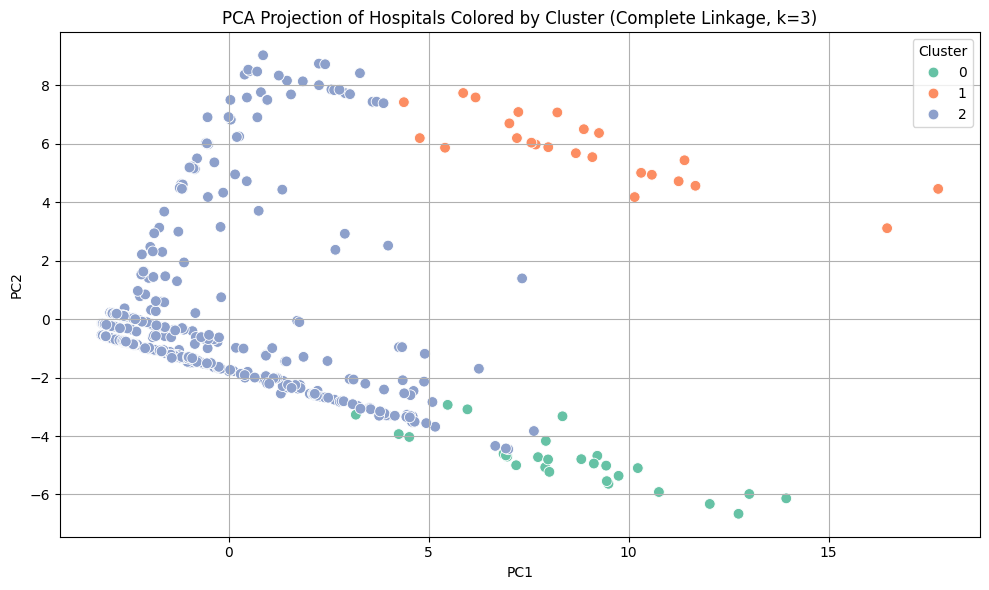

In [57]:
model_com = AgglomerativeClustering(n_clusters=3, linkage='complete')
df_meta['Cluster'] = model_com.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Complete Linkage, k=3)')
plt.grid(True)
plt.tight_layout()
plt.show()

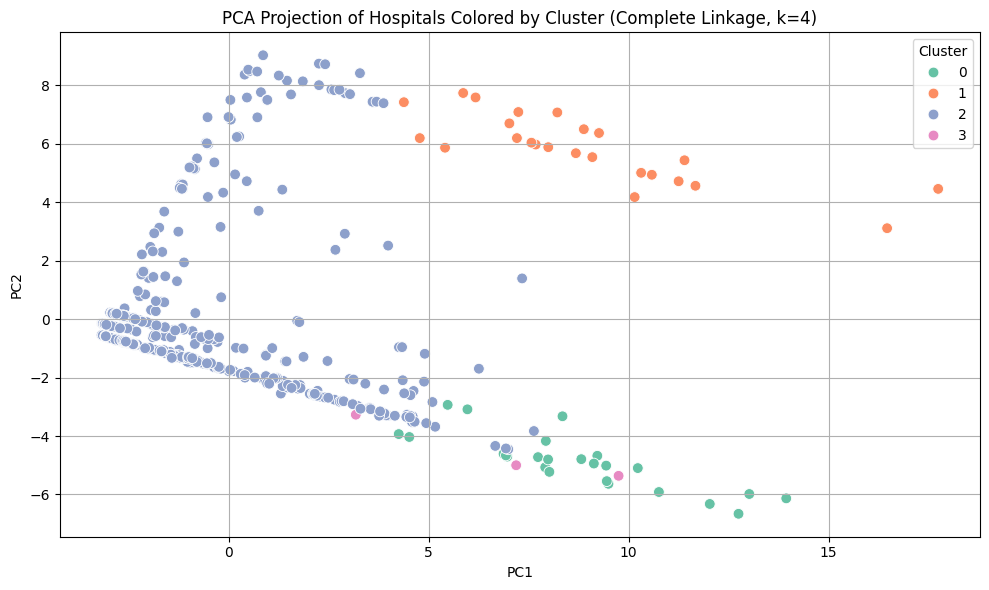

In [58]:
model_com = AgglomerativeClustering(n_clusters=4, linkage='complete')
df_meta['Cluster'] = model_com.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Complete Linkage, k=4)')
plt.grid(True)
plt.tight_layout()
plt.show()

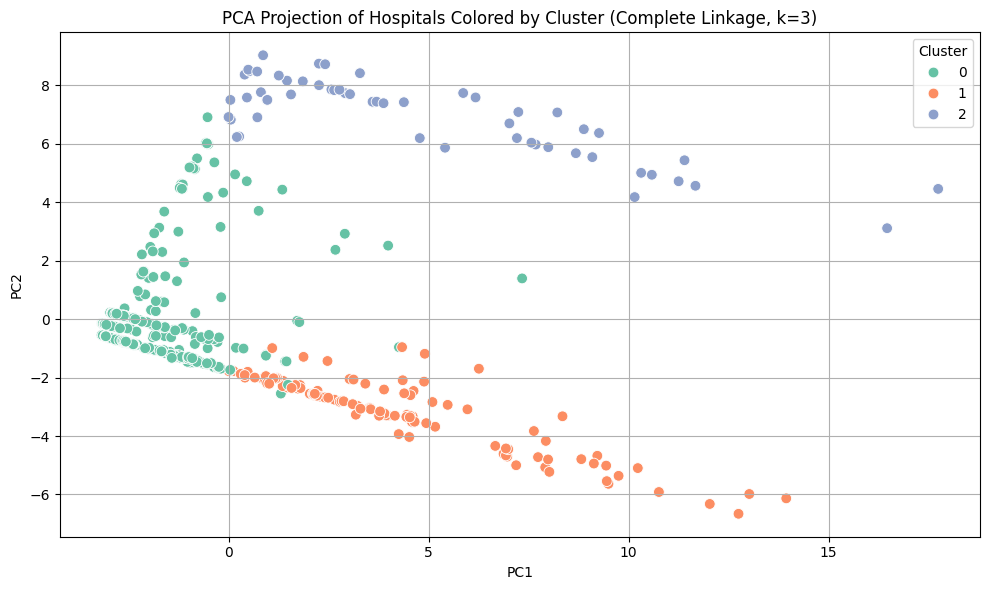

In [51]:
model_ward = AgglomerativeClustering(n_clusters=3, linkage='ward')
df_meta['Cluster'] = model_ward.fit_predict(df_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Complete Linkage, k=3)')
plt.grid(True)
plt.tight_layout()
plt.show()

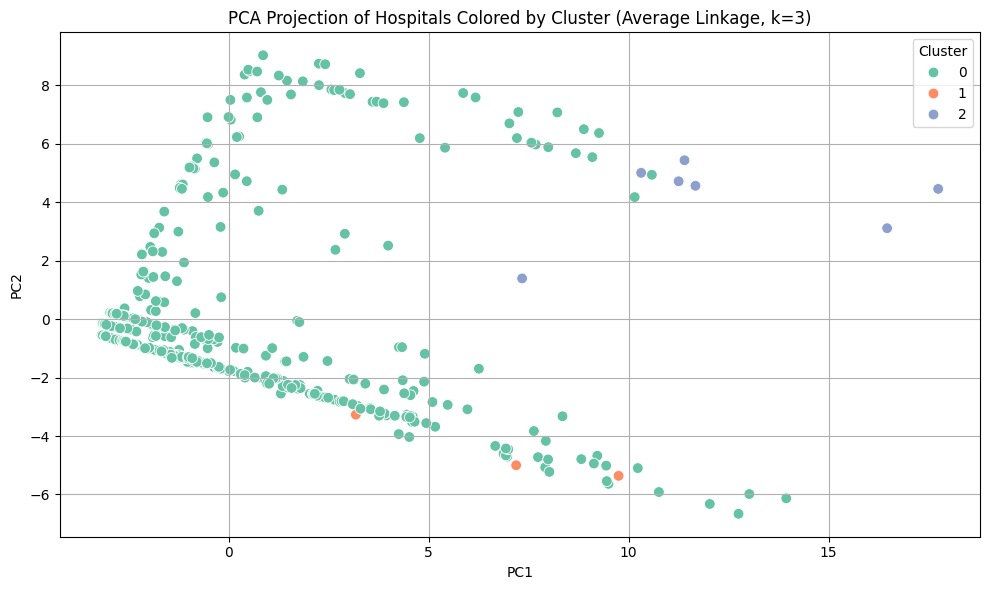

In [46]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
df_pca = pd.concat([df_pca, df_meta.reset_index(drop=True)], axis=1)

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Cluster', palette='Set2', s=60)
plt.title('PCA Projection of Hospitals Colored by Cluster (Average Linkage, k=3)')
plt.grid(True)
plt.tight_layout()
plt.show()

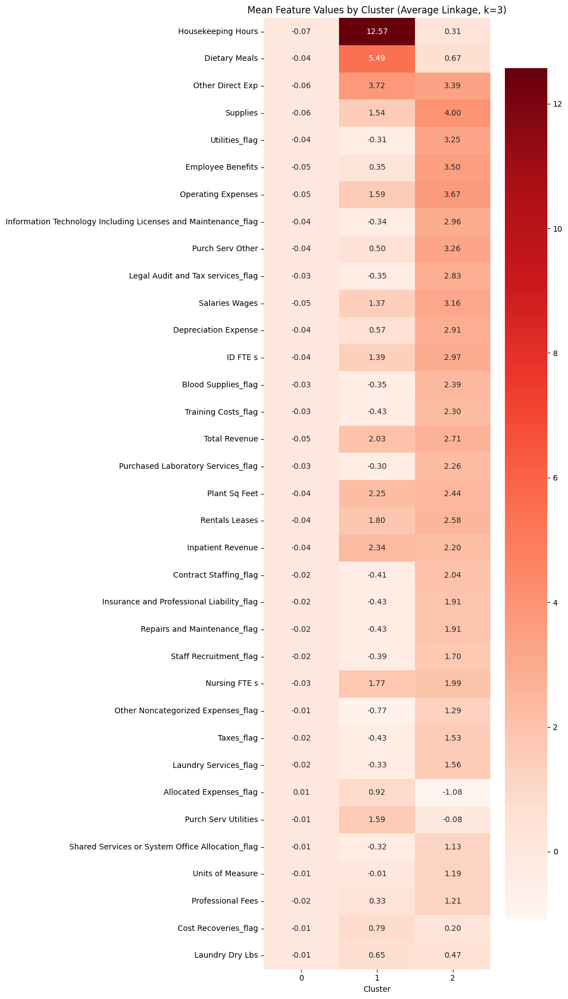

In [47]:
df_heat = pd.DataFrame(df_scaled, columns=numeric_cols + binary_cols)
df_heat['Cluster'] = df_meta['Cluster'].values

cluster_means = df_heat.groupby('Cluster').mean().T
cluster_means = cluster_means.loc[cluster_means.std(axis=1).sort_values(ascending=False).index]

plt.figure(figsize=(10, 18))
sns.heatmap(cluster_means, cmap='Reds', annot=True, fmt=".2f")
plt.title("Mean Feature Values by Cluster (Average Linkage, k=3)")
plt.tight_layout()
plt.show()


In [48]:
cluster_means = df_heat.groupby('Cluster').mean().T
feature_variability = cluster_means.std(axis=1).sort_values(ascending=False)
feature_variability.head(15)

,0
Housekeeping Hours,7.191516
Dietary Meals,3.008431
Other Direct Exp,2.092940
Supplies,2.045710
Utilities_flag,1.980126
Employee Benefits,1.945762
Operating Expenses,1.867895
Information Technology Including Licenses and Maintenance_flag,1.822722
Purch Serv Other,1.769574
Legal Audit and Tax services_flag,1.750592


In [ ]:
df_pca[['Hospital Name', 'Year', 'Ward_Cluster']].groupby('Ward_Cluster').head()


,Hospital Name,Year,Ward_Cluster
0,ASTRIA TOPPENISH HOSPITAL,2020,0
1,ASTRIA TOPPENISH HOSPITAL,2021,0
2,ASTRIA TOPPENISH HOSPITAL,2022,0
3,ASTRIA TOPPENISH HOSPITAL,2023,0
4,Arbor Health,2019,0
77,Deaconess Hospital - MultiCare Health Systems,2018,2
78,Deaconess Hospital - MultiCare Health Systems,2019,2
79,Deaconess Hospital - MultiCare Health Systems,2020,2
80,Deaconess Hospital - MultiCare Health Systems,2021,2
81,Deaconess Hospital - MultiCare Health Systems,2022,2


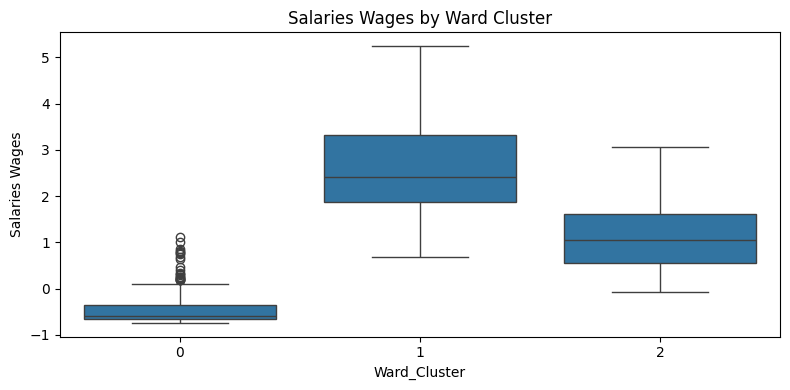

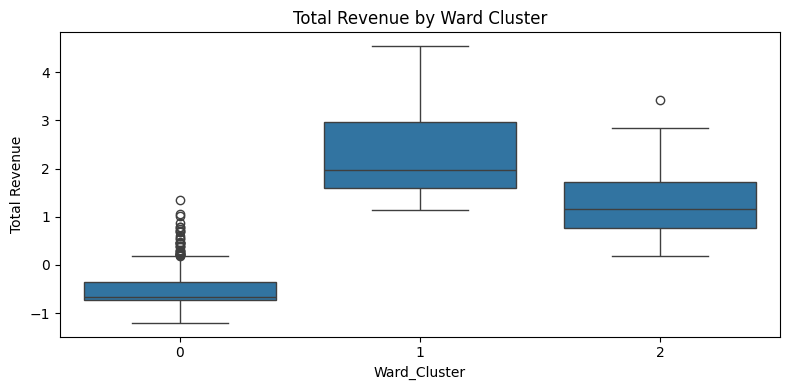

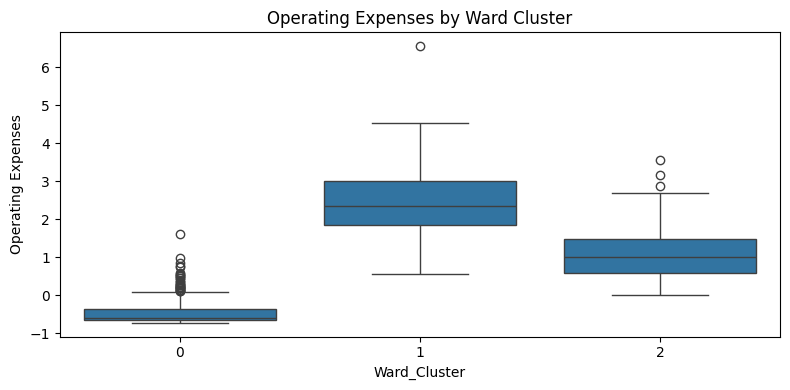

In [ ]:
df_plot = df_scaled.copy()
df_plot['Ward_Cluster'] = df_pca['Ward_Cluster'].values

# Choose top features to compare (or loop through all)
features_to_plot = ['Salaries Wages', 'Total Revenue', 'Operating Expenses']  # replace or extend

for feature in features_to_plot:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=df_plot, x='Ward_Cluster', y=feature)
    plt.title(f'{feature} by Ward Cluster')
    plt.tight_layout()
    plt.show()

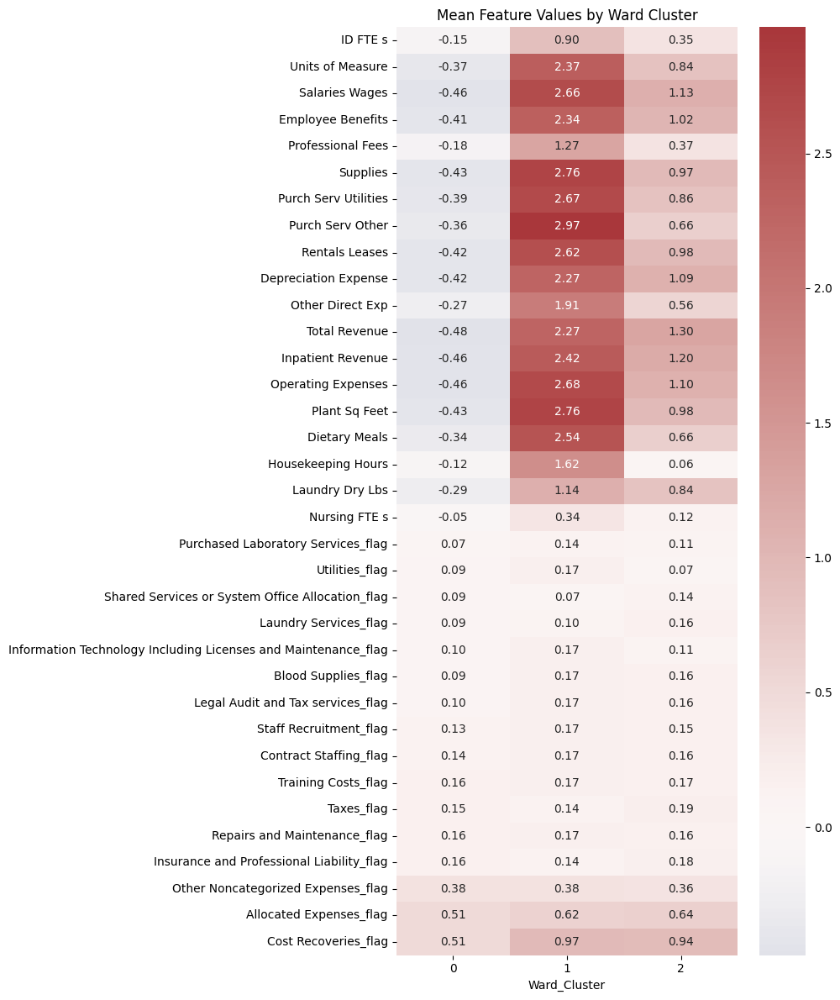

In [ ]:
cluster_means = df_plot.groupby('Ward_Cluster').mean().T

# Plot as heatmap
plt.figure(figsize=(10, 12))
sns.heatmap(cluster_means, annot=True, fmt=".2f", cmap="vlag", center=0)
plt.title("Mean Feature Values by Ward Cluster")
plt.tight_layout()
plt.show()

The most distinguishing features include:

- **High-cost items**: Salaries Wages, Supplies, Operating Expenses
- **Infrastructure flags**: Presence of Cost Recoveries, Allocated Expenses
- **Unit-based usage**: Dietary Meals, Plant Sq Feet, Laundry Dry Lbs

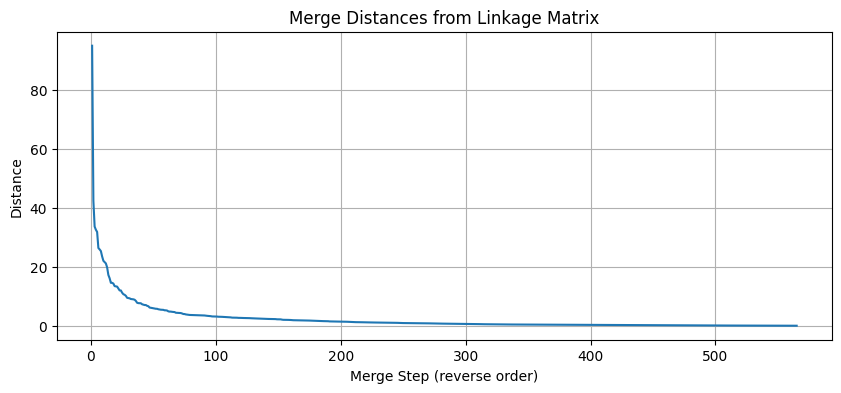

In [ ]:
distances = linkage_matrix[:, 2]

# Plot merge distances to identify elbow
plt.figure(figsize=(10, 4))
plt.plot(range(1, len(distances) + 1), sorted(distances, reverse=True))
plt.xlabel("Merge Step (reverse order)")
plt.ylabel("Distance")
plt.title("Merge Distances from Linkage Matrix")
plt.grid(True)
plt.show()

In [ ]:
ward_model = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='ward').fit(df_scaled)

# Compute linkage matrix from model
def compute_linkage(model):
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    linkage_matrix = np.column_stack([model.children_, model.distances_, counts]).astype(float)
    return linkage_matrix

linkage_matrix = compute_linkage(ward_model)

# Cut the dendrogram at a chosen threshold to define clusters
cut_threshold = 25  # adjust this for more or fewer clusters
clusters = fcluster(linkage_matrix, t=cut_threshold, criterion='distance')

# Add clusters to metadata
df_meta_clustered = df_meta.copy()
df_meta_clustered['Cluster'] = clusters

# Analyze: count of hospitals and years per cluster
cluster_by_hospital = df_meta_clustered.groupby(['Cluster', 'Hospital Name']).size().unstack(fill_value=0)
cluster_by_year = df_meta_clustered.groupby(['Cluster', 'Year']).size().unstack(fill_value=0)

# Display summaries
print("Clusters by Hospital:\n", cluster_by_hospital)
print("\nClusters by Year:\n", cluster_by_year)

# Optional: preview first few rows
df_meta_clustered.head()

Clusters by Hospital:
 Hospital Name  ASTRIA TOPPENISH HOSPITAL  Arbor Health  \
Cluster                                                  
1                                      2             1   
2                                      0             0   
3                                      2             4   
4                                      0             0   
5                                      0             0   
6                                      0             0   
7                                      0             0   
8                                      0             0   
9                                      0             0   

Hospital Name  Astria Sunnyside Hospital  Auburn Medical Center  \
Cluster                                                           
1                                      2                      0   
2                                      0                      0   
3                                      3                      5   
4  

,Hospital Name,Year,License Number,Acct #,Cluster
0,ASTRIA TOPPENISH HOSPITAL,2020,6766,291190,3
1,ASTRIA TOPPENISH HOSPITAL,2021,6766,291190,3
2,ASTRIA TOPPENISH HOSPITAL,2022,15721,601720,1
3,ASTRIA TOPPENISH HOSPITAL,2023,15721,601720,1
4,Arbor Health,2019,13840,610720,3
